In [1]:
# ============================================================================
# KAGGLE NOTEBOOK SETUP GUIDE - MODULE 1 - FIXED VERSION

# ============================================================================

"""
CELL 1: Install Compatible Libraries and Import
Run this first in your Kaggle notebook
"""

# First install specific compatible versions
!pip install scikit-image==0.19.3 opencv-python numpy==1.23.5 -q

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from skimage import io, color, exposure, filters, restoration
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.util import random_noise
import os
import warnings
warnings.filterwarnings('ignore')

plt.style.use('default')
print("✓ Libraries imported successfully!")
print(f"NumPy version: {np.__version__}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 73.9 MB/s eta 0:00:0000:0100:01
^C
ERROR: Operation cancelled by user
✓ Libraries imported successfully!
NumPy version: 1.26.4


In [10]:
import os
import cv2
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# Root dataset path
DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'

# List all subfolders (classes)
subfolders = [f for f in os.listdir(DATASET_PATH) 
              if os.path.isdir(os.path.join(DATASET_PATH, f))]
print("Found subfolders (classes):", subfolders)

# Folder dropdown
folder_dropdown = widgets.Dropdown(
    options=subfolders,
    description='Select class:',
    layout=widgets.Layout(width='90%')
)
display(folder_dropdown)

# Image dropdown (empty first)
image_dropdown = widgets.Dropdown(
    options=[],
    description='Select image:',
    layout=widgets.Layout(width='90%')
)
display(image_dropdown)

# Output area
out = widgets.Output()
display(out)

# Update images when folder changes
def update_images(change):
    folder_path = os.path.join(DATASET_PATH, folder_dropdown.value)
    images = [f for f in os.listdir(folder_path)
              if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    image_dropdown.options = images
    if images:
        image_dropdown.value = images[0]  # auto-select first image

folder_dropdown.observe(update_images, names='value')

# Display selected image
def display_image(change):
    with out:
        clear_output(wait=True)
        img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)
        
        img = cv2.imread(img_path)
        if img is None:
            print("Failed to load image!")
            return
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(6,6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Image: {image_dropdown.value}")
        plt.show()

        print(f"Image shape: {img.shape}")
        print(f"Loaded from: {img_path}")

image_dropdown.observe(display_image, names='value')

# Initialize first folder at start
update_images(None)


Found subfolders (classes): ['Leaf_Mold227', 'healthy227', 'Tomato_Yellow_Leaf_Curl_Virus227', 'Target_Spot227', 'Septoria_leaf_spot227', 'Early_blight227', 'Two-spotted_spider_mite227', 'Late_blight227', 'Bacterial_spot227']


Dropdown(description='Select class:', layout=Layout(width='90%'), options=('Leaf_Mold227', 'healthy227', 'Toma…

Dropdown(description='Select image:', layout=Layout(width='90%'), options=(), value=None)

Output()

In [11]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import cv2
import matplotlib.pyplot as plt
import os

# ---------- Helper: Show multiple images ----------
def show_images(images, titles, rows=1, figsize=(15,5)):
    cols = len(images)
    plt.figure(figsize=figsize)
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(titles[i])
    plt.show()

# ---------- DATASET ROOT ----------
DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'

# List subfolders
subfolders = [f for f in os.listdir(DATASET_PATH) if os.path.isdir(os.path.join(DATASET_PATH, f))]
print("Found subfolders (classes):", subfolders)

# ---------- Dropdown widgets ----------
folder_dropdown = widgets.Dropdown(
    options=subfolders,
    description='Select folder:',
    layout=widgets.Layout(width='90%')
)
image_dropdown = widgets.Dropdown(
    options=[],
    description='Select image:',
    layout=widgets.Layout(width='90%')
)

out = widgets.Output()

display(folder_dropdown)
display(image_dropdown)
display(out)

# ---------- Update images when folder changes ----------
def update_images(change):
    folder_path = os.path.join(DATASET_PATH, folder_dropdown.value)
    images = [f for f in os.listdir(folder_path)
              if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    image_dropdown.options = images
    if images:
        image_dropdown.value = images[0]

folder_dropdown.observe(update_images, names='value')

# ---------- Display image + apply geometric transforms ----------
def display_and_transform(change):
    with out:
        clear_output(wait=True)

        img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

        # Check existence
        if not os.path.isfile(img_path):
            print("File not found:", img_path)
            return

        # Load image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Show original
        plt.figure(figsize=(6,6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Original Image: {image_dropdown.value}")
        plt.show()

        print(f"Image shape: {img.shape}")
        print(f"Loaded from: {img_path}")

        # ----------------------
        #   GEOMETRIC TRANSFORMS
        # ----------------------
        h, w = img.shape[:2]
        center = (w // 2, h // 2)

        # Rotation
        angles = [0, 45, 90, 135, 180]
        rotated_imgs = []
        for angle in angles:
            M = cv2.getRotationMatrix2D(center, angle, 1.0)
            rotated_imgs.append(cv2.warpAffine(img, M, (w, h)))

        show_images(rotated_imgs, [f"{a}°" for a in angles], rows=1)

        # Scaling
        scales = [0.75, 1.0, 1.5]
        scaled_imgs = []
        for scale in scales:
            new_w, new_h = int(w * scale), int(h * scale)
            temp = cv2.resize(img, (new_w, new_h))

            # crop back to original size
            if scale > 1.0:
                start_x, start_y = (new_w - w) // 2, (new_h - h) // 2
                temp = temp[start_y:start_y+h, start_x:start_x+w]
            elif scale < 1.0:
                pad_h, pad_w = (h - new_h) // 2, (w - new_w) // 2
                temp = cv2.copyMakeBorder(
                    temp, pad_h, h-new_h-pad_h,
                    pad_w, w-new_w-pad_w,
                    cv2.BORDER_CONSTANT, value=[0,0,0]
                )
            scaled_imgs.append(temp)

        show_images(scaled_imgs, [f"Scale {s}x" for s in scales], rows=1)

        print("✓ Geometric transformations completed!")

# trigger when image is selected
image_dropdown.observe(display_and_transform, names='value')

# initialize
update_images(None)


Found subfolders (classes): ['Leaf_Mold227', 'healthy227', 'Tomato_Yellow_Leaf_Curl_Virus227', 'Target_Spot227', 'Septoria_leaf_spot227', 'Early_blight227', 'Two-spotted_spider_mite227', 'Late_blight227', 'Bacterial_spot227']


Dropdown(description='Select folder:', layout=Layout(width='90%'), options=('Leaf_Mold227', 'healthy227', 'Tom…

Dropdown(description='Select image:', layout=Layout(width='90%'), options=(), value=None)

Output()

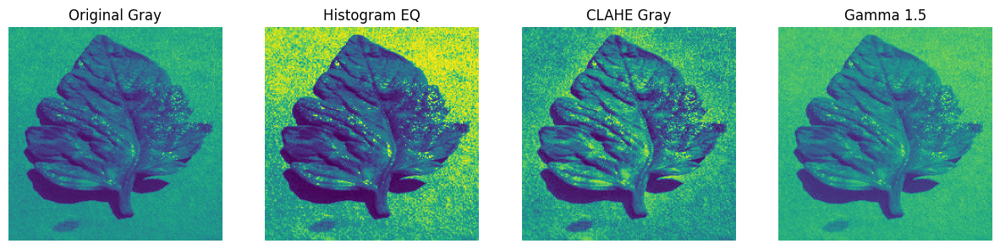

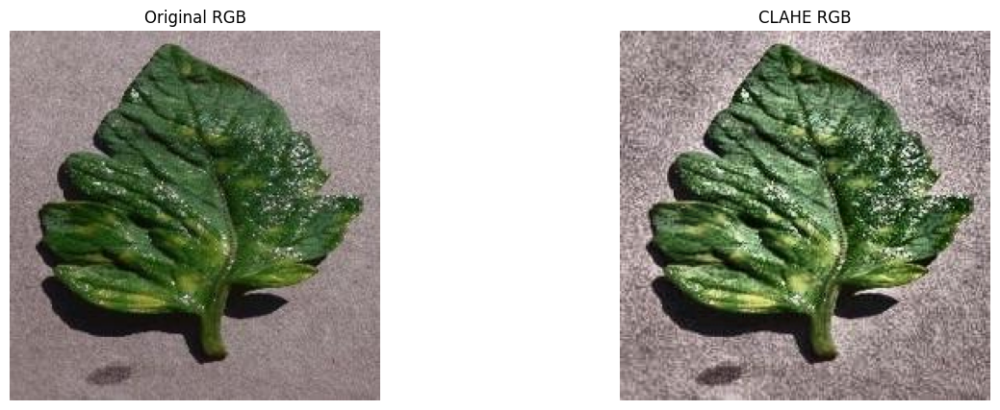

✓ Intensity transformations completed!
  ✔ CLAHE gives the best balanced contrast enhancement


In [13]:
"""
CELL 5: Intensity Transformations (UPDATED to use selected image)
"""

# Load image selected by the user
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

if not os.path.isfile(img_path):
    print(f"❌ File not found: {img_path}")
else:
    # Read + convert to RGB
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Histogram Equalization
    hist_eq = cv2.equalizeHist(gray)

    # CLAHE (better than regular histogram eq)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_result = clahe.apply(gray)

    # Gamma Correction
    gamma = 1.5
    inv_gamma = 1.0 / gamma
    table = np.array([((i/255.0)**inv_gamma)*255 for i in range(256)]).astype("uint8")
    gamma_corrected = cv2.LUT(gray, table)

    # Display grayscale-based intensity transformations
    results = [gray, hist_eq, clahe_result, gamma_corrected]
    titles = ['Original Gray', 'Histogram EQ', 'CLAHE Gray', f'Gamma {gamma}']

    show_images(results, titles, rows=1)

    # Apply CLAHE to RGB image (L-channel only)
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    img_lab[:, :, 0] = clahe.apply(img_lab[:, :, 0])
    img_clahe_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)

    # Display original vs CLAHE-enhanced RGB
    show_images([img, img_clahe_rgb], ['Original RGB', 'CLAHE RGB'], rows=1)

    print("✓ Intensity transformations completed!")
    print("  ✔ CLAHE gives the best balanced contrast enhancement")


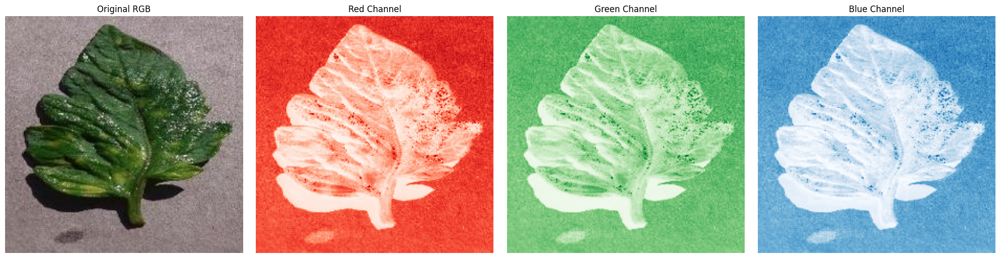

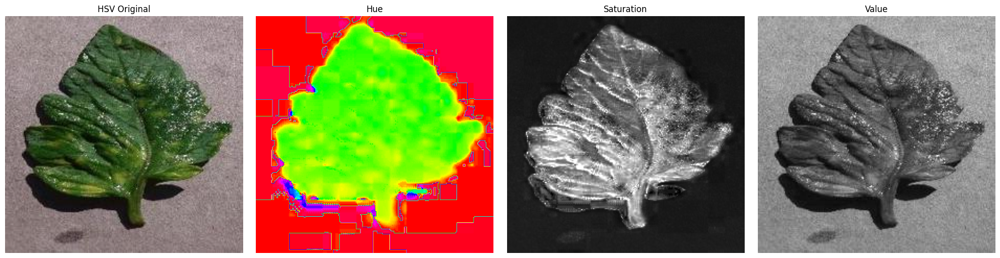

✓ Color space analysis completed!
  Key insight: HSV HUE channel often reveals disease patterns best.


In [14]:
"""
CELL 6: Color Space Analysis
"""

# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

if not os.path.isfile(img_path):
    print(f"❌ File not found: {img_path}")
else:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to different color spaces
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)

    # --- RGB Channels ---
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(img)
    axes[0].set_title('Original RGB')
    axes[1].imshow(img[:,:,0], cmap='Reds')
    axes[1].set_title('Red Channel')
    axes[2].imshow(img[:,:,1], cmap='Greens')
    axes[2].set_title('Green Channel')
    axes[3].imshow(img[:,:,2], cmap='Blues')
    axes[3].set_title('Blue Channel')

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    # --- HSV Channels ---
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB))
    axes[0].set_title('HSV Original')
    axes[1].imshow(img_hsv[:,:,0], cmap='hsv')
    axes[1].set_title('Hue')
    axes[2].imshow(img_hsv[:,:,1], cmap='gray')
    axes[2].set_title('Saturation')
    axes[3].imshow(img_hsv[:,:,2], cmap='gray')
    axes[3].set_title('Value')

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    print("✓ Color space analysis completed!")
    print("  Key insight: HSV HUE channel often reveals disease patterns best.")


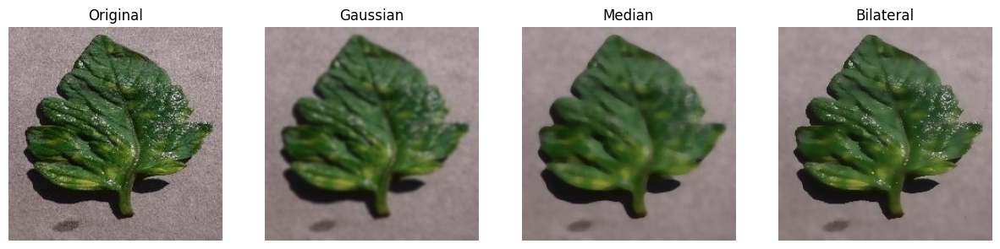

✓ Filtering completed!
  Bilateral filter preserves edges best while smoothing


In [15]:
"""
CELL 7: Filtering Techniques
"""
# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

# Different filters
gaussian = cv2.GaussianBlur(img, (7, 7), 0)
median = cv2.medianBlur(img, 7)
bilateral = cv2.bilateralFilter(img, 9, 75, 75)

# Display
filters = [img, gaussian, median, bilateral]
titles = ['Original', 'Gaussian', 'Median', 'Bilateral']
show_images(filters, titles, rows=1)

print("✓ Filtering completed!")
print("  Bilateral filter preserves edges best while smoothing")

# ============================================================================


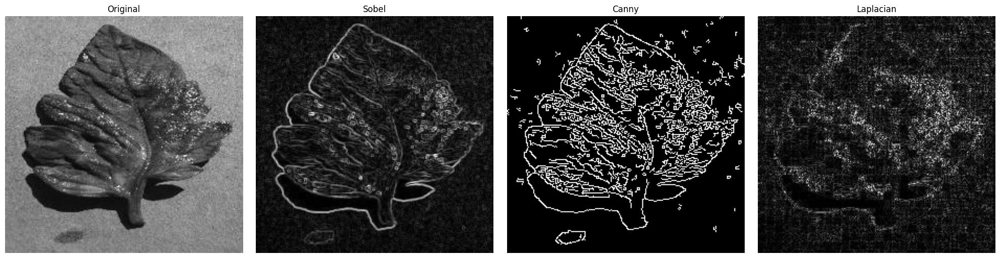

✓ Edge detection completed!
  Canny provides cleanest edge detection


In [16]:
"""
CELL 8: Edge Detection
"""
# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel = np.sqrt(sobelx**2 + sobely**2)
sobel = np.uint8(sobel / sobel.max() * 255)

# Canny
canny = cv2.Canny(gray, 100, 200)

# Laplacian
laplacian = cv2.Laplacian(gray, cv2.CV_64F)
laplacian = np.uint8(np.absolute(laplacian))

# Display
edges = [gray, sobel, canny, laplacian]
titles = ['Original', 'Sobel', 'Canny', 'Laplacian']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for ax, edge, title in zip(axes, edges, titles):
    ax.imshow(edge, cmap='gray')
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()

print("✓ Edge detection completed!")
print("  Canny provides cleanest edge detection")

# ============================================================================


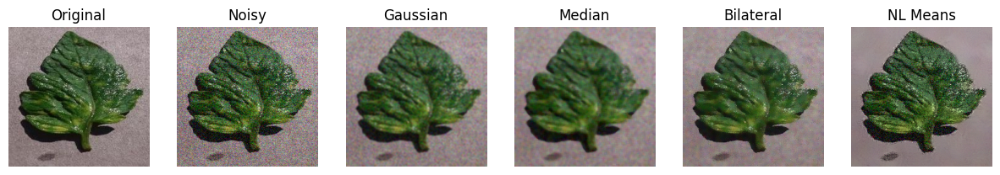


Restoration Quality (PSNR):
  Gaussian    : PSNR=25.28 dB, SSIM=0.6154
  Median      : PSNR=24.07 dB, SSIM=0.4939
  Bilateral   : PSNR=27.00 dB, SSIM=0.6878
  NL Means    : PSNR=24.19 dB, SSIM=0.6088

✓ Noise restoration completed!
  Best performer: Non-Local Means Denoising


In [17]:
"""
CELL 9: Noise Addition and Restoration
"""

# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

# Add Gaussian noise
img_float = img.astype(float) / 255.0
noisy = random_noise(img_float, mode='gaussian', var=0.01)
noisy = (noisy * 255).astype(np.uint8)

# Restoration methods
restored_gaussian = cv2.GaussianBlur(noisy, (5, 5), 0)
restored_median = cv2.medianBlur(noisy, 5)
restored_bilateral = cv2.bilateralFilter(noisy, 9, 75, 75)
restored_nlm = cv2.fastNlMeansDenoisingColored(noisy, None, 10, 10, 7, 21)

# Display
results = [img, noisy, restored_gaussian, restored_median, 
          restored_bilateral, restored_nlm]
titles = ['Original', 'Noisy', 'Gaussian', 'Median', 'Bilateral', 'NL Means']
show_images(results, titles, rows=2)

# Calculate metrics
print("\nRestoration Quality (PSNR):")
for name, restored in [('Gaussian', restored_gaussian), 
                       ('Median', restored_median),
                       ('Bilateral', restored_bilateral), 
                       ('NL Means', restored_nlm)]:
    psnr_val = psnr(img, restored)
    ssim_val = ssim(img, restored, channel_axis=2)
    print(f"  {name:12s}: PSNR={psnr_val:.2f} dB, SSIM={ssim_val:.4f}")

print("\n✓ Noise restoration completed!")
print("  Best performer: Non-Local Means Denoising")

# ============================================================================


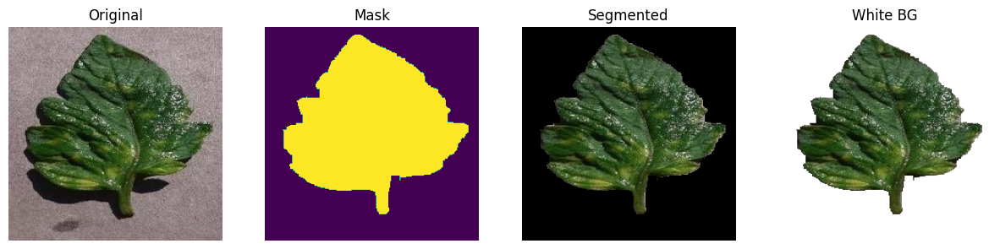

✓ Leaf segmentation completed!
  Tip: Adjust HSV ranges if segmentation is poor


In [18]:
"""
CELL 10: Leaf Segmentation
"""
# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

# Convert to HSV for color-based segmentation
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

# Define green color range (adjust for your dataset)
lower_green = np.array([25, 40, 40])
upper_green = np.array([85, 255, 255])

# Create mask
mask = cv2.inRange(hsv, lower_green, upper_green)

# Morphological operations
kernel = np.ones((5,5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

# Apply mask
segmented = cv2.bitwise_and(img, img, mask=mask_clean)

# White background version
white_bg = img.copy()
white_bg[mask_clean == 0] = [255, 255, 255]

# Display
show_images([img, mask_clean, segmented, white_bg],
           ['Original', 'Mask', 'Segmented', 'White BG'], rows=1)

print("✓ Leaf segmentation completed!")
print("  Tip: Adjust HSV ranges if segmentation is poor")

# ============================================================================


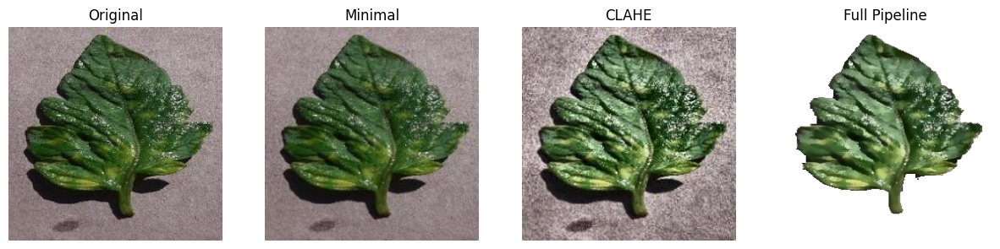

✓ Preprocessing pipeline comparison completed!

Recommendation: Use 'full' pipeline for best results


In [19]:
"""
CELL 11: Complete Preprocessing Pipeline
"""
# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

def preprocess_image(img, pipeline='full'):
    """
    Apply complete preprocessing pipeline
    
    Pipelines:
    - 'minimal': Just resize
    - 'clahe': Resize + CLAHE
    - 'full': Resize + Bilateral + CLAHE + Segmentation
    """
    target_size = (256, 256)
    
    # Resize
    processed = cv2.resize(img, target_size)
    
    if pipeline in ['clahe', 'full']:
        # Apply CLAHE
        img_lab = cv2.cvtColor(processed, cv2.COLOR_RGB2LAB)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        img_lab[:,:,0] = clahe.apply(img_lab[:,:,0])
        processed = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)
    
    if pipeline == 'full':
        # Apply bilateral filter
        processed = cv2.bilateralFilter(processed, 9, 75, 75)
        
        # Segment leaf
        hsv = cv2.cvtColor(processed, cv2.COLOR_RGB2HSV)
        lower = np.array([25, 40, 40])
        upper = np.array([85, 255, 255])
        mask = cv2.inRange(hsv, lower, upper)
        kernel = np.ones((5,5), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
        processed = cv2.bitwise_and(processed, processed, mask=mask)
        processed[mask == 0] = [255, 255, 255]
    
    return processed

# Test different pipelines
minimal = preprocess_image(img, 'minimal')
clahe_only = preprocess_image(img, 'clahe')
full = preprocess_image(img, 'full')

show_images([img, minimal, clahe_only, full],
           ['Original', 'Minimal', 'CLAHE', 'Full Pipeline'], rows=1)

print("✓ Preprocessing pipeline comparison completed!")
print("\nRecommendation: Use 'full' pipeline for best results")

# ============================================================================


In [27]:
"""
CELL 12: Batch Process Multiple Images (Select Subfolder)
"""

import os
import cv2
import ipywidgets as widgets
from IPython.display import display, clear_output

# Output folder
output_dir = 'preprocessed'
os.makedirs(output_dir, exist_ok=True)

# Get subfolders inside dataset
subfolders = [os.path.join(DATASET_PATH, d) for d in os.listdir(DATASET_PATH) 
              if os.path.isdir(os.path.join(DATASET_PATH, d))]

# Dropdown to select subfolder
folder_dropdown = widgets.Dropdown(
    options=subfolders,
    description='Select folder:',
    layout=widgets.Layout(width='80%')
)
display(folder_dropdown)

# Output widget for messages
out = widgets.Output()
display(out)

# Updated process_and_save function
def process_and_save(image_path, output_dir='preprocessed'):
    try:
        img = cv2.imread(image_path)
        if img is None:
            return None
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        processed = preprocess_image(img, 'full')  # keep RGB
        filename = os.path.basename(image_path)
        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, cv2.cvtColor(processed, cv2.COLOR_RGB2BGR))
        return output_path
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None

# When subfolder is selected, process images
def process_folder(change):
    folder = folder_dropdown.value
    if not folder:
        return
    
    image_paths = [os.path.join(folder, f) for f in os.listdir(folder) 
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    with out:
        clear_output(wait=True)
        print(f"Found {len(image_paths)} images in folder: {folder}")
        print("Processing images...")
        processed_count = 0
        for img_path in image_paths:
            if process_and_save(img_path, output_dir):
                processed_count += 1
        print(f"\n✓ Processed {processed_count} images")
        print(f"Saved to: /kaggle/working/{output_dir}/")

# Attach function to dropdown
folder_dropdown.observe(process_folder, names='value')


Dropdown(description='Select folder:', layout=Layout(width='80%'), options=('/kaggle/input/dataset-tomato-spli…

Output()

Images found: ['aug_0_6747.jpg', 'aug_0349.jpg', 'aug_0_8023.jpg', 'aug_0024.jpg', 'Lb557.jpg']


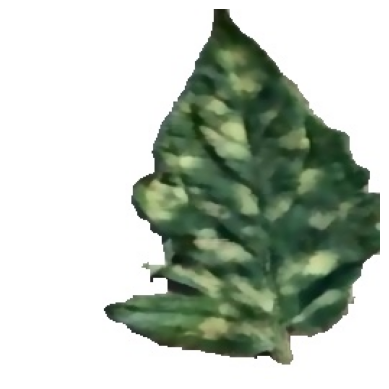

In [29]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Path to the unzipped dataset in /kaggle/working
dataset_dir = '/kaggle/working/preprocessed'  # Change if your folder name is different

# List files
images = [f for f in os.listdir(dataset_dir) if f.endswith('.jpg') or f.endswith('.png')]
print("Images found:", images[:5])  # Show first 5 image names

# Display first image
img_path = os.path.join(dataset_dir, images[1])
img = mpimg.imread(img_path)
plt.imshow(img)
plt.axis('off')
plt.show()


> **Module 2**

In [30]:
"""
CELL 1: Install Additional Libraries
"""
!pip install scikit-image -q

print("✓ Libraries installed!")

# ============================================================================

"""
CELL 2: Import All Libraries
"""
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import warnings
warnings.filterwarnings('ignore')

from skimage.feature import local_binary_pattern, hog, graycomatrix, graycoprops
from scipy.stats import skew, kurtosis

# ML Libraries
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (classification_report, confusion_matrix, 
                             accuracy_score, precision_recall_fscore_support)
from sklearn.cluster import KMeans

np.random.seed(42)
plt.style.use('default')

print("✓ All libraries imported!")

# ============================================================================

✓ Libraries installed!
✓ All libraries imported!


In [31]:
# Paths
DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'  # Corrected path
OUTPUT_PATH = '/kaggle/working/module2/'

# Create directories
os.makedirs(f'{OUTPUT_PATH}features/', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}visualizations/', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}results/', exist_ok=True)

print(f"✓ Output directory: {OUTPUT_PATH}")


✓ Output directory: /kaggle/working/module2/


In [32]:
# ============================================================================
# COMPLETE FEATURE EXTRACTION SYSTEM WITH INTERACTIVE VISUALIZATION
# Combines: LBP, GLCM, HOG, Color Histograms, Color Moments
# ============================================================================

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops, hog
from scipy.stats import skew, kurtosis
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================

DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'

# Verify path exists
if not os.path.exists(DATASET_PATH):
    raise FileNotFoundError(f"Dataset path not found: {DATASET_PATH}")

# ============================================================================
# STATE MANAGEMENT CLASS
# ============================================================================

class ImageFeatureState:
    """Centralized state management for image and extracted features"""
    def __init__(self):
        self.current_image = None
        self.current_path = None
        self.features = {}
        
    def load_image(self, path):
        """Load image once and cache it"""
        if path == self.current_path and self.current_image is not None:
            return self.current_image
            
        img = cv2.imread(path)
        if img is None:
            raise ValueError(f"Failed to load image: {path}")
        
        # Robust format handling
        if len(img.shape) == 2:  # Grayscale
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        elif img.shape[2] == 4:  # RGBA
            img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGB)
        else:  # BGR
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
        self.current_image = img
        self.current_path = path
        self.features = {}  # Reset features when new image loaded
        return img
    
    def get_grayscale(self):
        """Get grayscale version of current image"""
        if self.current_image is None:
            raise ValueError("No image loaded")
        
        if len(self.current_image.shape) == 2:
            return self.current_image
        return cv2.cvtColor(self.current_image, cv2.COLOR_RGB2GRAY)

# Initialize state
state = ImageFeatureState()

# ============================================================================
# FEATURE EXTRACTION FUNCTIONS
# ============================================================================

# -----------------------------------------------------------------------------
# 1. LBP (Local Binary Pattern) - Texture Analysis
# -----------------------------------------------------------------------------

def extract_lbp(image, radius=3, n_points=24, return_image=False):
    """
    Extract LBP texture features
    
    Args:
        image: RGB image (numpy array)
        radius: Radius of circular neighborhood
        n_points: Number of sampling points
        return_image: If True, return LBP image for visualization
        
    Returns:
        hist: Normalized histogram of LBP patterns
        lbp_image: (optional) LBP pattern image
    """
    try:
        # Convert to grayscale safely
        if len(image.shape) == 2:
            gray = image
        else:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        # Compute LBP
        lbp = local_binary_pattern(gray, n_points, radius, method='uniform')
        
        # Calculate histogram
        n_bins = n_points + 2
        hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins))
        
        # Normalize
        hist = hist.astype('float')
        hist /= (hist.sum() + 1e-7)
        
        if return_image:
            return hist, lbp.astype(np.uint8)
        return hist
        
    except Exception as e:
        raise RuntimeError(f"LBP extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 2. GLCM (Gray Level Co-occurrence Matrix) - Spatial Texture
# -----------------------------------------------------------------------------

def extract_glcm(image, distances=[1, 2, 3], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4], 
                return_image=False):
    """
    Extract GLCM texture features
    
    Args:
        image: RGB image
        distances: List of pixel distances
        angles: List of angles in radians
        return_image: If True, return grayscale image used
        
    Returns:
        features: Array of GLCM properties (contrast, dissimilarity, etc.)
        gray: (optional) Grayscale image used for GLCM
    """
    try:
        # Convert to grayscale
        if len(image.shape) == 2:
            gray = image
        else:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        # Reduce gray levels for computational efficiency
        gray_reduced = (gray / 32).astype(np.uint8)
        
        # Compute GLCM
        glcm = graycomatrix(gray_reduced, distances=distances, angles=angles,
                           levels=8, symmetric=True, normed=True)
        
        # Extract properties
        features = []
        properties = ['contrast', 'dissimilarity', 'homogeneity', 
                     'energy', 'correlation', 'ASM']
        
        for prop in properties:
            prop_values = graycoprops(glcm, prop).flatten()
            features.extend(prop_values)
        
        features = np.array(features)
        
        if return_image:
            return features, gray
        return features
        
    except Exception as e:
        raise RuntimeError(f"GLCM extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 3. HOG (Histogram of Oriented Gradients) - Shape/Edge Features
# -----------------------------------------------------------------------------

def extract_hog(image, orientations=9, pixels_per_cell=(8, 8), 
               cells_per_block=(2, 2), return_image=False):
    """
    Extract HOG shape features
    
    Args:
        image: RGB image
        orientations: Number of orientation bins
        pixels_per_cell: Size of a cell
        cells_per_block: Number of cells in each block
        return_image: If True, return HOG visualization
        
    Returns:
        features: HOG feature vector
        hog_image: (optional) HOG visualization
    """
    try:
        # Convert to grayscale
        if len(image.shape) == 2:
            gray = image
        else:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        # Extract HOG features
        if return_image:
            features, hog_image = hog(
                gray,
                orientations=orientations,
                pixels_per_cell=pixels_per_cell,
                cells_per_block=cells_per_block,
                block_norm='L2-Hys',
                visualize=True,
                feature_vector=True
            )
            return features, hog_image
        else:
            features = hog(
                gray,
                orientations=orientations,
                pixels_per_cell=pixels_per_cell,
                cells_per_block=cells_per_block,
                block_norm='L2-Hys',
                visualize=False,
                feature_vector=True
            )
            return features
            
    except Exception as e:
        raise RuntimeError(f"HOG extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 4. Color Histogram - Color Distribution
# -----------------------------------------------------------------------------

def extract_color_histogram(image, bins=32, color_space='HSV', return_image=False):
    """
    Extract color histogram features
    
    Args:
        image: RGB image
        bins: Number of histogram bins per channel
        color_space: 'RGB', 'HSV', or 'LAB'
        return_image: If True, return converted image
        
    Returns:
        histogram: Concatenated histograms for all channels
        converted: (optional) Image in target color space
    """
    try:
        # Convert color space
        if color_space == 'HSV':
            converted = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LAB':
            converted = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        elif color_space == 'RGB':
            converted = image.copy()
        else:
            raise ValueError(f"Unknown color space: {color_space}")
        
        # Calculate histogram for each channel
        histograms = []
        for i in range(3):
            hist, _ = np.histogram(converted[:,:,i], bins=bins, 
                                 range=(0, 256), density=True)
            histograms.extend(hist)
        
        hist_array = np.array(histograms)
        
        if return_image:
            return hist_array, converted
        return hist_array
        
    except Exception as e:
        raise RuntimeError(f"Color histogram extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 5. Color Moments - Statistical Color Features
# -----------------------------------------------------------------------------

def extract_color_moments(image, color_space='HSV', return_image=False):
    """
    Extract color statistical moments (mean, std, skewness, kurtosis)
    
    Args:
        image: RGB image
        color_space: 'RGB', 'HSV', or 'LAB'
        return_image: If True, return converted image
        
    Returns:
        moments: Array of statistical moments for each channel
        converted: (optional) Image in target color space
    """
    try:
        # Convert color space
        if color_space == 'HSV':
            converted = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LAB':
            converted = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        elif color_space == 'RGB':
            converted = image.copy()
        else:
            raise ValueError(f"Unknown color space: {color_space}")
        
        # Calculate moments for each channel
        moments = []
        for i in range(3):
            channel = converted[:,:,i].flatten()
            moments.extend([
                np.mean(channel),           # Mean
                np.std(channel),            # Standard deviation
                skew(channel),              # Skewness
                kurtosis(channel)           # Kurtosis
            ])
        
        moments_array = np.array(moments)
        
        if return_image:
            return moments_array, converted
        return moments_array
        
    except Exception as e:
        raise RuntimeError(f"Color moments extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 6. Combined Feature Extraction
# -----------------------------------------------------------------------------

def extract_all_features(image, return_visualizations=False):
    """
    Extract all features from image in one call
    
    Args:
        image: RGB image
        return_visualizations: If True, return images for visualization
        
    Returns:
        features: Combined feature vector
        visualizations: (optional) Dictionary of visualization images
    """
    try:
        visualizations = {}
        
        # Extract all features
        lbp_hist, lbp_img = extract_lbp(image, return_image=True)
        glcm_features, glcm_img = extract_glcm(image, return_image=True)
        hog_features, hog_img = extract_hog(image, return_image=True)
        hist_rgb, rgb_img = extract_color_histogram(image, color_space='RGB', return_image=True)
        hist_hsv, hsv_img = extract_color_histogram(image, color_space='HSV', return_image=True)
        moments_rgb = extract_color_moments(image, color_space='RGB')
        moments_hsv = extract_color_moments(image, color_space='HSV')
        
        # Combine all features
        combined_features = np.concatenate([
            lbp_hist,           # 26 features
            glcm_features,      # 72 features
            hog_features,       # ~8000 features (depends on image size)
            hist_rgb,           # 96 features (32 bins × 3 channels)
            hist_hsv,           # 96 features
            moments_rgb,        # 12 features (4 moments × 3 channels)
            moments_hsv         # 12 features
        ])
        
        if return_visualizations:
            visualizations = {
                'lbp': lbp_img,
                'glcm': glcm_img,
                'hog': hog_img,
                'rgb': rgb_img,
                'hsv': hsv_img
            }
            return combined_features, visualizations
        
        return combined_features
        
    except Exception as e:
        raise RuntimeError(f"Combined feature extraction failed: {str(e)}")

# ============================================================================
# VISUALIZATION FUNCTIONS
# ============================================================================

def visualize_all_features(image):
    """
    Create comprehensive visualization of all extracted features
    
    Args:
        image: RGB image
    """
    try:
        # Extract features with visualizations
        features, vis_images = extract_all_features(image, return_visualizations=True)
        
        # Also get individual feature vectors for detailed display
        lbp_hist, _ = extract_lbp(image, return_image=True)
        glcm_features, _ = extract_glcm(image, return_image=True)
        hog_features, _ = extract_hog(image, return_image=True)
        hist_hsv, _ = extract_color_histogram(image, color_space='HSV', return_image=True)
        moments_hsv = extract_color_moments(image, color_space='HSV')
        
        # Create comprehensive visualization
        fig = plt.figure(figsize=(20, 12))
        
        # Row 1: Original and Feature Images
        plt.subplot(3, 5, 1)
        plt.imshow(image)
        plt.title('Original Image', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 5, 2)
        plt.imshow(vis_images['lbp'], cmap='gray')
        plt.title('LBP Pattern', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 5, 3)
        plt.imshow(vis_images['glcm'], cmap='gray')
        plt.title('GLCM (Grayscale)', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 5, 4)
        plt.imshow(vis_images['hog'], cmap='gray')
        plt.title('HOG Visualization', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 5, 5)
        plt.imshow(vis_images['hsv'])
        plt.title('HSV Color Space', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        # Row 2: Feature Distributions
        plt.subplot(3, 5, 6)
        plt.bar(range(len(lbp_hist)), lbp_hist, color='steelblue')
        plt.title(f'LBP Histogram ({len(lbp_hist)} bins)', fontsize=11)
        plt.xlabel('Pattern')
        plt.ylabel('Frequency')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(3, 5, 7)
        plt.bar(range(len(glcm_features)), glcm_features, color='forestgreen')
        plt.title(f'GLCM Features ({len(glcm_features)})', fontsize=11)
        plt.xlabel('Feature Index')
        plt.ylabel('Value')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(3, 5, 8)
        plt.plot(hog_features[:200], color='darkred')
        plt.title(f'HOG (first 200 of {len(hog_features)})', fontsize=11)
        plt.xlabel('Feature Index')
        plt.ylabel('Value')
        plt.grid(True, alpha=0.3)
        
        # Row 2, col 4: HSV Histogram
        plt.subplot(3, 5, 9)
        bins_per_channel = len(hist_hsv) // 3
        x = np.arange(bins_per_channel)
        plt.plot(x, hist_hsv[:bins_per_channel], label='Hue', color='red')
        plt.plot(x, hist_hsv[bins_per_channel:2*bins_per_channel], label='Sat', color='green')
        plt.plot(x, hist_hsv[2*bins_per_channel:], label='Val', color='blue')
        plt.title('HSV Histogram', fontsize=11)
        plt.xlabel('Bin')
        plt.ylabel('Frequency')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Row 2, col 5: Color Moments
        plt.subplot(3, 5, 10)
        moment_labels = ['H-μ', 'H-σ', 'H-Skew', 'H-Kurt',
                        'S-μ', 'S-σ', 'S-Skew', 'S-Kurt',
                        'V-μ', 'V-σ', 'V-Skew', 'V-Kurt']
        colors_moments = ['red']*4 + ['green']*4 + ['blue']*4
        plt.bar(range(len(moments_hsv)), moments_hsv, color=colors_moments, alpha=0.7)
        plt.title('HSV Color Moments', fontsize=11)
        plt.xticks(range(len(moments_hsv)), moment_labels, rotation=45, ha='right', fontsize=8)
        plt.ylabel('Value')
        plt.grid(True, alpha=0.3, axis='y')
        
        # Row 3: Feature Summary Statistics
        plt.subplot(3, 5, 11)
        feature_breakdown = {
            'LBP': len(lbp_hist),
            'GLCM': len(glcm_features),
            'HOG': len(hog_features),
            'Hist-RGB': len(hist_hsv),  # Same size as HSV
            'Hist-HSV': len(hist_hsv),
            'Mom-RGB': 12,
            'Mom-HSV': 12
        }
        plt.bar(feature_breakdown.keys(), feature_breakdown.values(), color='orchid')
        plt.title('Feature Vector Sizes', fontsize=11, fontweight='bold')
        plt.ylabel('Number of Features')
        plt.xticks(rotation=45, ha='right')
        plt.grid(True, alpha=0.3, axis='y')
        
        # Row 3: Summary Text
        plt.subplot(3, 5, 12)
        plt.axis('off')
        summary_text = f"""
FEATURE EXTRACTION SUMMARY

Total Features: {len(features)}

Breakdown:
- LBP (texture): {len(lbp_hist)}
- GLCM (texture): {len(glcm_features)}
- HOG (shape): {len(hog_features)}
- RGB Histogram: {len(hist_hsv)}
- HSV Histogram: {len(hist_hsv)}
- RGB Moments: 12
- HSV Moments: 12

Image Shape: {image.shape}
        """
        plt.text(0.1, 0.5, summary_text, fontsize=10, verticalalignment='center',
                family='monospace', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))
        
        plt.tight_layout()
        plt.show()
        
        # Print detailed information
        print("="*70)
        print("FEATURE EXTRACTION COMPLETE")
        print("="*70)
        print(f"\nTotal feature vector length: {len(features)}")
        print(f"\nFeature breakdown:")
        for name, count in feature_breakdown.items():
            print(f"  {name:12s}: {count:6d} features")
        print(f"\nFeature vector statistics:")
        print(f"  Min:    {features.min():.6f}")
        print(f"  Max:    {features.max():.6f}")
        print(f"  Mean:   {features.mean():.6f}")
        print(f"  Std:    {features.std():.6f}")
        
        return features
        
    except Exception as e:
        print(f"❌ Visualization failed: {str(e)}")
        raise

# ============================================================================
# INTERACTIVE WIDGET SETUP
# ============================================================================

# List subfolders (classes)
subfolders = [f for f in os.listdir(DATASET_PATH) 
              if os.path.isdir(os.path.join(DATASET_PATH, f))]

if not subfolders:
    raise ValueError("No subfolders found in dataset path!")

print(f"Found {len(subfolders)} classes:")
for i, f in enumerate(subfolders, 1):
    print(f"  {i}. {f}")

# Create widgets
folder_dropdown = widgets.Dropdown(
    options=subfolders,
    description='Class:',
    layout=widgets.Layout(width='90%'),
    style={'description_width': '100px'}
)

image_dropdown = widgets.Dropdown(
    options=[],
    description='Image:',
    layout=widgets.Layout(width='90%'),
    style={'description_width': '100px'}
)

# Output widget
out_features = widgets.Output()

# Display widgets
display(widgets.HTML("<h2>🔬 Interactive Feature Extraction System</h2>"))
display(folder_dropdown)
display(image_dropdown)
display(out_features)

# ============================================================================
# WIDGET EVENT HANDLERS
# ============================================================================

def update_images(change):
    """Update image dropdown when folder changes"""
    folder_path = os.path.join(DATASET_PATH, folder_dropdown.value)
    images = [f for f in os.listdir(folder_path) 
              if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    if not images:
        with out_features:
            clear_output()
            print(f"⚠️ No images found in folder: {folder_dropdown.value}")
        image_dropdown.options = []
        return
    
    image_dropdown.options = images
    if images:
        image_dropdown.value = images[0]  # Trigger update

def update_features(change):
    """Extract and visualize features for selected image"""
    if not image_dropdown.value:
        return
    
    img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)
    
    with out_features:
        clear_output(wait=True)
        
        try:
            print("Loading image and extracting features...")
            print(f"Path: {img_path}\n")
            
            # Load image using state management
            img = state.load_image(img_path)
            
            # Visualize all features
            features = visualize_all_features(img)
            
            # Store in state
            state.features['combined'] = features
            
            print(f"\n✅ Feature extraction successful!")
            print(f"✅ Features stored in state.features['combined']")
            
        except Exception as e:
            print(f"❌ Error: {str(e)}")
            import traceback
            traceback.print_exc()

# Attach observers
folder_dropdown.observe(update_images, names='value')
image_dropdown.observe(update_features, names='value')

# Initialize
update_images(None)

print("\n" + "="*70)
print("✅ INTERACTIVE FEATURE EXTRACTION SYSTEM READY")
print("="*70)
print("Select a class and image from the dropdowns above to extract features.")

Found 9 classes:
  1. Leaf_Mold227
  2. healthy227
  3. Tomato_Yellow_Leaf_Curl_Virus227
  4. Target_Spot227
  5. Septoria_leaf_spot227
  6. Early_blight227
  7. Two-spotted_spider_mite227
  8. Late_blight227
  9. Bacterial_spot227


HTML(value='<h2>🔬 Interactive Feature Extraction System</h2>')

Dropdown(description='Class:', layout=Layout(width='90%'), options=('Leaf_Mold227', 'healthy227', 'Tomato_Yell…

Dropdown(description='Image:', layout=Layout(width='90%'), options=(), style=DescriptionStyle(description_widt…

Output()


✅ INTERACTIVE FEATURE EXTRACTION SYSTEM READY
Select a class and image from the dropdowns above to extract features.


In [33]:
# ============================================================================
# CELL 10: Extract Features from All Images (Simple Batch Processing)
# ============================================================================

import os
import cv2
import numpy as np
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops, hog
from scipy.stats import skew, kurtosis
import warnings
warnings.filterwarnings('ignore')

DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'
OUTPUT_PATH = '/kaggle/working/module2/'

os.makedirs(f'{OUTPUT_PATH}features/', exist_ok=True)

# ----------------------------------------------------------------------------
# Feature Extraction Functions
# ----------------------------------------------------------------------------

def extract_lbp(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    lbp = local_binary_pattern(gray, 24, 3, method='uniform')
    hist, _ = np.histogram(lbp.ravel(), bins=26, range=(0, 26))
    return hist.astype('float') / (hist.sum() + 1e-7)

def extract_glcm(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    gray = (gray / 32).astype(np.uint8)
    glcm = graycomatrix(gray, [1, 2, 3], [0, np.pi/4, np.pi/2, 3*np.pi/4], 
                        levels=8, symmetric=True, normed=True)
    features = []
    for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']:
        features.extend(graycoprops(glcm, prop).flatten())
    return np.array(features)

def extract_hog(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    features = hog(gray, orientations=9, pixels_per_cell=(8, 8),
                   cells_per_block=(2, 2), block_norm='L2-Hys')
    return features

def extract_color_histogram(image, color_space='HSV'):
    if color_space == 'HSV':
        converted = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    else:
        converted = image.copy()
    histograms = []
    for i in range(3):
        hist, _ = np.histogram(converted[:,:,i], bins=32, range=(0, 256), density=True)
        histograms.extend(hist)
    return np.array(histograms)

def extract_color_moments(image, color_space='HSV'):
    if color_space == 'HSV':
        converted = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    else:
        converted = image.copy()
    moments = []
    for i in range(3):
        channel = converted[:,:,i].flatten()
        moments.extend([np.mean(channel), np.std(channel), skew(channel), kurtosis(channel)])
    return np.array(moments)

def extract_all_features(image):
    lbp = extract_lbp(image)
    glcm = extract_glcm(image)
    hog_feat = extract_hog(image)
    hist_rgb = extract_color_histogram(image, 'RGB')
    hist_hsv = extract_color_histogram(image, 'HSV')
    moments_rgb = extract_color_moments(image, 'RGB')
    moments_hsv = extract_color_moments(image, 'HSV')
    
    return np.concatenate([lbp, glcm, hog_feat, hist_rgb, hist_hsv, moments_rgb, moments_hsv])

# ----------------------------------------------------------------------------
# Load Images and Extract Features
# ----------------------------------------------------------------------------

print("Loading images from dataset...")

X = []
y = []
image_count = 0

# Loop through each class folder
for class_name in os.listdir(DATASET_PATH):
    class_path = os.path.join(DATASET_PATH, class_name)
    
    if not os.path.isdir(class_path):
        continue
    
    print(f"\nProcessing class: {class_name}")
    
    # Loop through images in class
    for img_file in os.listdir(class_path):
        if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        
        img_path = os.path.join(class_path, img_file)
        
        try:
            # Load image
            img = cv2.imread(img_path)
            if img is None:
                continue
            
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (256, 256))  # Resize for consistency
            
            # Extract features
            features = extract_all_features(img)
            
            X.append(features)
            y.append(class_name)
            image_count += 1
            
            if image_count % 50 == 0:
                print(f"  Processed {image_count} images...")
            
        except Exception as e:
            print(f"  ⚠️ Error processing {img_file}: {e}")
            continue

# Convert to numpy arrays
X = np.array(X)
y = np.array(y)

print("\n" + "="*70)
print("FEATURE EXTRACTION COMPLETE")
print("="*70)
print(f"Total images processed: {len(X)}")
print(f"Feature vector size: {X.shape[1]}")
print(f"Classes: {np.unique(y)}")
print(f"Class distribution:")
for class_name in np.unique(y):
    count = np.sum(y == class_name)
    print(f"  {class_name}: {count} images")

# Save features
np.save(f'{OUTPUT_PATH}features/X_features.npy', X)
np.save(f'{OUTPUT_PATH}features/y_labels.npy', y)

print(f"\n✓ Features saved to {OUTPUT_PATH}features/")
print("✅ Ready for Cell 11!")

Loading images from dataset...

Processing class: Leaf_Mold227
  Processed 50 images...
  Processed 100 images...
  Processed 150 images...
  Processed 200 images...
  Processed 250 images...
  Processed 300 images...
  Processed 350 images...
  Processed 400 images...
  Processed 450 images...
  Processed 500 images...
  Processed 550 images...
  Processed 600 images...
  Processed 650 images...
  Processed 700 images...
  Processed 750 images...
  Processed 800 images...
  Processed 850 images...
  Processed 900 images...
  Processed 950 images...
  Processed 1000 images...
  Processed 1050 images...
  Processed 1100 images...
  Processed 1150 images...
  Processed 1200 images...
  Processed 1250 images...
  Processed 1300 images...

Processing class: healthy227
  Processed 1350 images...
  Processed 1400 images...
  Processed 1450 images...
  Processed 1500 images...
  Processed 1550 images...
  Processed 1600 images...
  Processed 1650 images...
  Processed 1700 images...
  Process

In [36]:
import os

# Root path to your split dataset
DATASET_PATH = '/kaggle/input/dataset-tomato-split'

splits = ['train', 'valid', 'test']

# First, get all classes from the train folder (assuming all splits have same classes)
classes = [f for f in os.listdir(os.path.join(DATASET_PATH, 'train')) 
           if os.path.isdir(os.path.join(DATASET_PATH, 'train', f))]

# Dictionary to store counts
counts_summary = {cls: {'train':0, 'valid':0, 'test':0} for cls in classes}

# Count images per split
for split in splits:
    split_path = os.path.join(DATASET_PATH, split)
    for cls in classes:
        cls_path = os.path.join(split_path, cls)
        if os.path.exists(cls_path):
            images = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg','.jpeg','.png'))]
            counts_summary[cls][split] = len(images)

# Print summary table
print(f"{'Class':35s} {'Train':>6s} {'Valid':>6s} {'Test':>6s} {'Total':>6s}")
print("-"*65)
for cls in classes:
    t = counts_summary[cls]['train']
    v = counts_summary[cls]['valid']
    te = counts_summary[cls]['test']
    total = t + v + te
    print(f"{cls:35s} {t:6d} {v:6d} {te:6d} {total:6d}")


Class                                Train  Valid   Test  Total
-----------------------------------------------------------------
Leaf_Mold227                          1320     60    120   1500
healthy227                            1320     60    120   1500
Tomato_Yellow_Leaf_Curl_Virus227      1320     60    120   1500
Target_Spot227                        1320     60    120   1500
Septoria_leaf_spot227                 1320     60    120   1500
Early_blight227                       1320     60    120   1500
Two-spotted_spider_mite227            1320     60    120   1500
Late_blight227                        1320     60    120   1500
Bacterial_spot227                     1320     60    120   1500


Original features: 34910
Reduced features: 5107
Explained variance: 0.9500


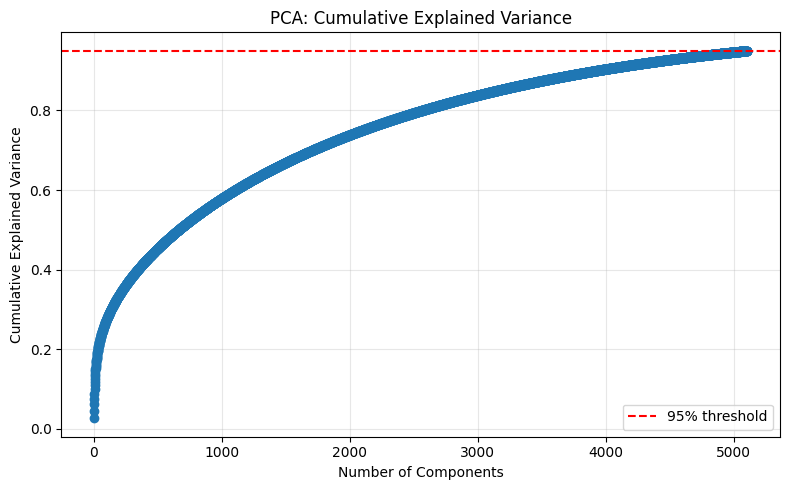

In [38]:
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import os

# Paths
FEATURE_PATH = '/kaggle/working/module2/features'
OUTPUT_PATH = '/kaggle/working/module2/visualizations'

os.makedirs(OUTPUT_PATH, exist_ok=True)

# Load features
X = np.load(os.path.join(FEATURE_PATH, 'X_features.npy'))
y = np.load(os.path.join(FEATURE_PATH, 'y_labels.npy'))

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=0.95, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca  = pca.transform(X_test_scaled)

print(f"Original features: {X_train_scaled.shape[1]}")
print(f"Reduced features: {X_train_pca.shape[1]}")
print(f"Explained variance: {pca.explained_variance_ratio_.sum():.4f}")

# Plot explained variance
cum_var = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(8,5))
plt.plot(range(1, len(cum_var)+1), cum_var, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA: Cumulative Explained Variance')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_PATH, 'pca_cumulative_variance.png'), dpi=300)
plt.show()


SVM Test Accuracy: 0.7517
                                  precision    recall  f1-score   support

               Bacterial_spot227       0.66      0.99      0.79       264
                 Early_blight227       0.91      0.59      0.72       264
                  Late_blight227       0.88      0.66      0.75       264
                    Leaf_Mold227       0.89      0.71      0.79       264
           Septoria_leaf_spot227       0.57      0.75      0.65       264
                  Target_Spot227       0.79      0.55      0.64       264
Tomato_Yellow_Leaf_Curl_Virus227       0.97      0.75      0.85       264
      Two-spotted_spider_mite227       0.65      0.82      0.73       264
                      healthy227       0.76      0.94      0.84       264

                        accuracy                           0.75      2376
                       macro avg       0.79      0.75      0.75      2376
                    weighted avg       0.79      0.75      0.75      2376



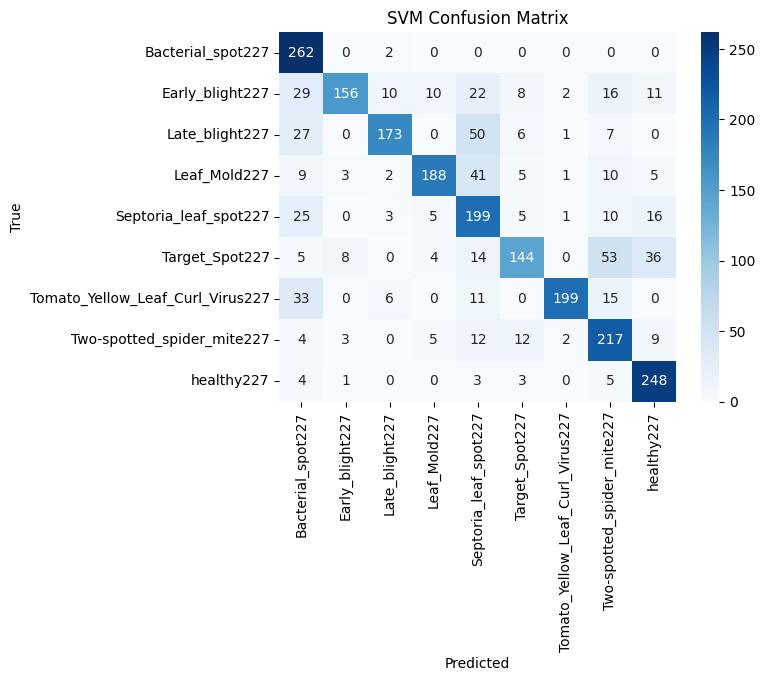

In [41]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Train SVM with RBF kernel
svm = SVC(kernel='rbf', C=10, gamma='scale', random_state=42)
svm.fit(X_train_pca, y_train)

# Predictions
y_pred = svm.predict(X_test_pca)

# Accuracy
print(f"SVM Test Accuracy: {accuracy_score(y_test, y_pred):.4f}")

# Classification report
print(classification_report(y_test, y_pred, target_names=le.classes_))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('SVM Confusion Matrix')
plt.show()


Random Forest Test Accuracy: 0.4827
                                  precision    recall  f1-score   support

               Bacterial_spot227       0.53      0.84      0.65       264
                 Early_blight227       0.41      0.26      0.32       264
                  Late_blight227       0.67      0.53      0.59       264
                    Leaf_Mold227       0.38      0.45      0.41       264
           Septoria_leaf_spot227       0.39      0.36      0.37       264
                  Target_Spot227       0.30      0.16      0.21       264
Tomato_Yellow_Leaf_Curl_Virus227       0.66      0.55      0.60       264
      Two-spotted_spider_mite227       0.51      0.59      0.55       264
                      healthy227       0.44      0.60      0.51       264

                        accuracy                           0.48      2376
                       macro avg       0.48      0.48      0.47      2376
                    weighted avg       0.48      0.48      0.47      2376


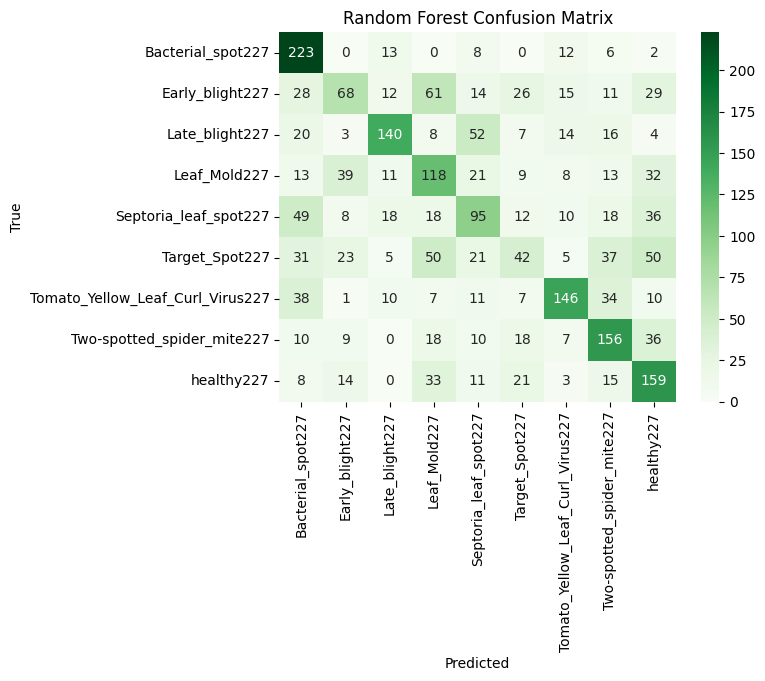

In [43]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, max_depth=20, random_state=42, n_jobs=-1)
rf.fit(X_train_pca, y_train)

# Predictions
y_pred = rf.predict(X_test_pca)

# Accuracy
print(f"Random Forest Test Accuracy: {accuracy_score(y_test, y_pred):.4f}")

# Classification report
print(classification_report(y_test, y_pred, target_names=le.classes_))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Random Forest Confusion Matrix')
plt.show()


In [44]:
# Required imports
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, classification_report

# List of classifiers
models = {
    "SVM (RBF)": SVC(kernel='rbf', C=10, gamma='scale', random_state=42),
    "SVM (Poly)": SVC(kernel='poly', degree=3, C=10, gamma='scale', random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, max_depth=20, random_state=42),
    "k-NN": KNeighborsClassifier(n_neighbors=5, weights='distance')
}

# Stratified 5-fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Train, predict, and evaluate
for name, model in models.items():
    print(f"\n{name}")
    print("-"*40)
    
    # Cross-validation
    scores = cross_val_score(model, X_train_pca, y_train, cv=skf, scoring='accuracy')
    print(f"CV Accuracy: {scores.mean():.4f} (+/- {scores.std():.4f})")
    
    # Train on full training set
    model.fit(X_train_pca, y_train)
    
    # Test set evaluation
    y_pred = model.predict(X_test_pca)
    acc = accuracy_score(y_test, y_pred)
    print(f"Test Accuracy: {acc:.4f}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=le.classes_))



SVM (RBF)
----------------------------------------
CV Accuracy: 0.7720 (+/- 0.0061)
Test Accuracy: 0.7517
Classification Report:
                                  precision    recall  f1-score   support

               Bacterial_spot227       0.66      0.99      0.79       264
                 Early_blight227       0.91      0.59      0.72       264
                  Late_blight227       0.88      0.66      0.75       264
                    Leaf_Mold227       0.89      0.71      0.79       264
           Septoria_leaf_spot227       0.57      0.75      0.65       264
                  Target_Spot227       0.79      0.55      0.64       264
Tomato_Yellow_Leaf_Curl_Virus227       0.97      0.75      0.85       264
      Two-spotted_spider_mite227       0.65      0.82      0.73       264
                      healthy227       0.76      0.94      0.84       264

                        accuracy                           0.75      2376
                       macro avg       0.79      0.75 

**Module 3**

Found 11880 images belonging to 9 classes.
Found 540 images belonging to 9 classes.
Found 1080 images belonging to 9 classes.


I0000 00:00:1764511168.648258      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1764511168.649024      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20


I0000 00:00:1764511180.726617     159 service.cc:148] XLA service 0x79707c005c60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764511180.727436     159 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1764511180.727460     159 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1764511182.572575     159 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/372 ━━━━━━━━━━━━━━━━━━━━ 1:57:36 19s/step - accuracy: 0.0625 - loss: 2.6496

I0000 00:00:1764511192.190036     159 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


372/372 ━━━━━━━━━━━━━━━━━━━━ 330s 837ms/step - accuracy: 0.1653 - loss: 2.3150 - val_accuracy: 0.5056 - val_loss: 1.6469
Epoch 2/20
372/372 ━━━━━━━━━━━━━━━━━━━━ 241s 648ms/step - accuracy: 0.3976 - loss: 1.7161 - val_accuracy: 0.6074 - val_loss: 1.3435
Epoch 3/20
372/372 ━━━━━━━━━━━━━━━━━━━━ 240s 644ms/step - accuracy: 0.5279 - loss: 1.4036 - val_accuracy: 0.6556 - val_loss: 1.1774
Epoch 4/20
372/372 ━━━━━━━━━━━━━━━━━━━━ 237s 638ms/step - accuracy: 0.5981 - loss: 1.2294 - val_accuracy: 0.7019 - val_loss: 1.0586
Epoch 5/20
372/372 ━━━━━━━━━━━━━━━━━━━━ 243s 653ms/step - accuracy: 0.6316 - loss: 1.1280 - val_accuracy: 0.7167 - val_loss: 1.0037
Epoch 6/20
372/372 ━━━━━━━━━━━━━━━━━━━━ 243s 652ms/step - accuracy: 0.6659 - loss: 1.0396 - val_accuracy: 0.7389 - val_loss: 0.9395
Epoch 7/20
372/372 ━━━━━━━━━━━━━━━━━━━━ 241s 649ms/step - accuracy: 0.6750 - loss: 0.9839 - val_accuracy: 0.7407 - val_loss: 0.8863
Epoch 8/20
372/372 ━━━━━━━━━━━━━━━━━━━━ 235s 632ms/step - accuracy: 0.7040 - loss: 0.90

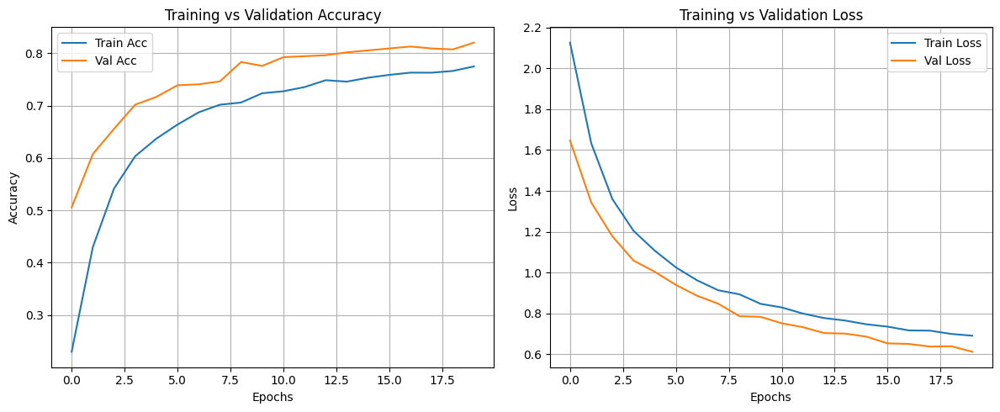

In [2]:
# ============================
# MODULE 3: Tomato Disease Classification with InceptionV3
# ============================

import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# ----------------------------
# 1️⃣ Dataset Paths
# ----------------------------
TRAIN_DIR = '/kaggle/input/dataset-tomato-split/train'
VALID_DIR = '/kaggle/input/dataset-tomato-split/valid'
TEST_DIR  = '/kaggle/input/dataset-tomato-split/test'

IMG_SIZE = (299, 299)  # InceptionV3 default input size
BATCH_SIZE = 32
NUM_CLASSES = len(os.listdir(TRAIN_DIR))

# ----------------------------
# 2️⃣ Data Augmentation
# ----------------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    shear_range=0.1,
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

valid_gen = valid_datagen.flow_from_directory(
    VALID_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_gen = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# ----------------------------
# 3️⃣ Load Pretrained InceptionV3
# ----------------------------
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# ----------------------------
# 4️⃣ Callbacks (fixed)
# ----------------------------
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True)
]

# ----------------------------
# 5️⃣ Train the model
# ----------------------------
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=20,
    callbacks=callbacks
)

# ----------------------------
# 6️⃣ Save the full model after all epochs (fixed)
# ----------------------------
model.save('full_model_after_epochs.keras')


# ----------------------------
# 7️⃣ Evaluate on test set
# ----------------------------
test_loss, test_acc = model.evaluate(test_gen)
print(f"\n✓ Test Accuracy: {test_acc:.4f}")

# ----------------------------
# 8️⃣ Plot training history
# ----------------------------
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# ============================
# END OF MODULE 3 PIPELINE
# ============================



Found 11880 images belonging to 9 classes.
Found 540 images belonging to 9 classes.
Found 1080 images belonging to 9 classes.
Epoch 1/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 308s 383ms/step - accuracy: 0.6059 - loss: 1.1946 - val_accuracy: 0.8500 - val_loss: 0.5163 - learning_rate: 1.0000e-05
Epoch 2/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 269s 362ms/step - accuracy: 0.7989 - loss: 0.6069 - val_accuracy: 0.8778 - val_loss: 0.4041 - learning_rate: 1.0000e-05
Epoch 3/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 268s 360ms/step - accuracy: 0.8353 - loss: 0.4840 - val_accuracy: 0.8963 - val_loss: 0.3572 - learning_rate: 1.0000e-05
Epoch 4/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 273s 367ms/step - accuracy: 0.8551 - loss: 0.4295 - val_accuracy: 0.9130 - val_loss: 0.3033 - learning_rate: 1.0000e-05
Epoch 5/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 274s 369ms/step - accuracy: 0.8761 - loss: 0.3526 - val_accuracy: 0.9148 - val_loss: 0.2890 - learning_rate: 1.0000e-05
Epoch 6/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 272s 366ms/step - accuracy: 0.8860

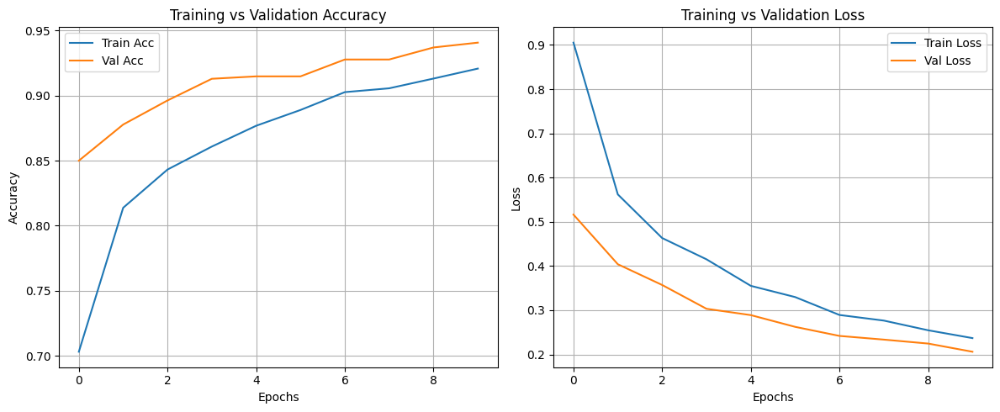

In [3]:
# ============================
# IMPROVE SAVED TOMATO DISEASE MODEL (FIXED)
# ============================

import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

# ----------------------------
# 1️⃣ Dataset Paths
# ----------------------------
TRAIN_DIR = '/kaggle/input/dataset-tomato-split/train'
VALID_DIR = '/kaggle/input/dataset-tomato-split/valid'
TEST_DIR  = '/kaggle/input/dataset-tomato-split/test'

IMG_SIZE = (299, 299)
BATCH_SIZE = 16  # smaller batch for fine-tuning

# ----------------------------
# 2️⃣ Data Augmentation
# ----------------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.7,1.3],
    shear_range=0.2,
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

valid_gen = valid_datagen.flow_from_directory(
    VALID_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_gen = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# ----------------------------
# 3️⃣ Load Existing Model
# ----------------------------
model = load_model('full_model_after_epochs.keras')  # your 80% accuracy model

# ----------------------------
# 4️⃣ Fine-Tune Last Layers
# ----------------------------
# Unfreeze last 50 layers of the model (skip the final Dense output)
for layer in model.layers[-51:-1]:
    layer.trainable = True

# Re-compile with small learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# ----------------------------
# 5️⃣ Callbacks
# ----------------------------
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    ModelCheckpoint('improved_model.keras', monitor='val_accuracy', save_best_only=True)
]

# ----------------------------
# 6️⃣ Fine-Tune Training
# ----------------------------
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=10,  # fine-tune for 5–10 epochs
    callbacks=callbacks
)

# ----------------------------
# 7️⃣ Evaluate on Test Set
# ----------------------------
test_loss, test_acc = model.evaluate(test_gen)
print(f"\n✓ Test Accuracy After Fine-Tuning: {test_acc:.4f}")

# ----------------------------
# 8️⃣ Plot Training History
# ----------------------------
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# ============================
# END OF FINE-TUNING PIPELINE
# ============================


Found 1080 images belonging to 9 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - accuracy: 0.9400 - loss: 0.2019

📌 Test Accuracy = 94.17%
📌 Test Loss      = 0.1723
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 135ms/step


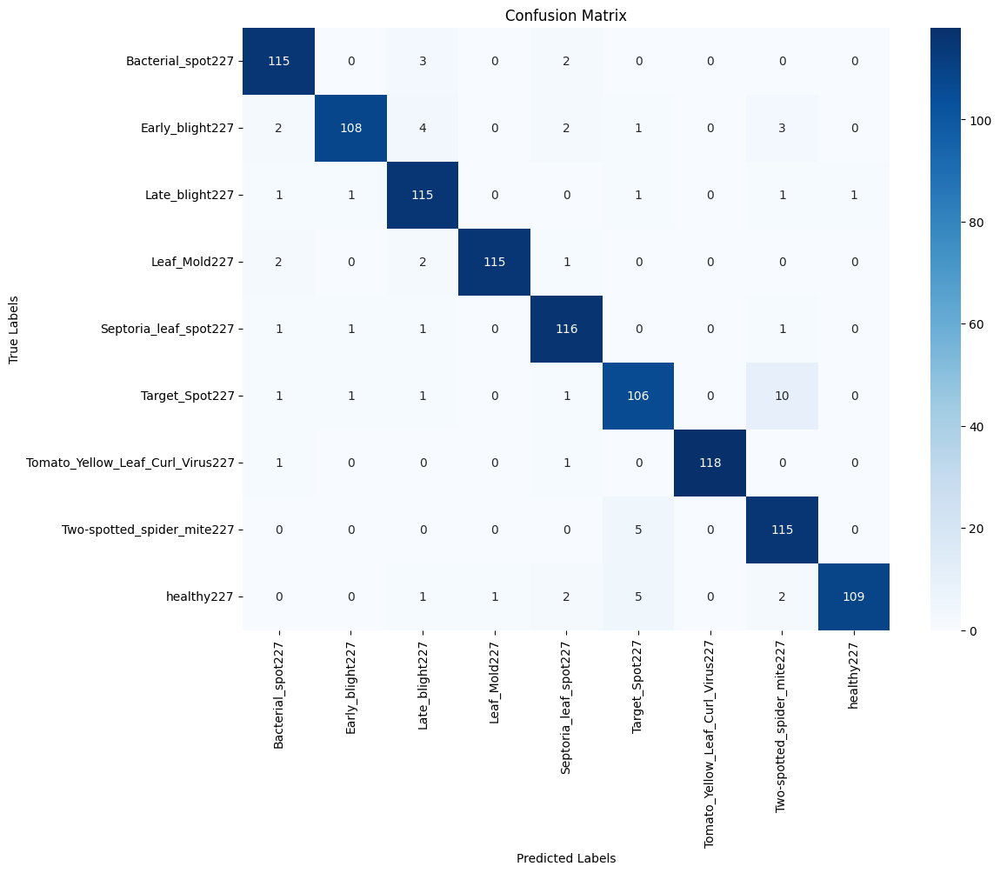


📌 Classification Report:
                                  precision    recall  f1-score   support

               Bacterial_spot227       0.93      0.96      0.95       120
                 Early_blight227       0.97      0.90      0.94       120
                  Late_blight227       0.91      0.96      0.93       120
                    Leaf_Mold227       0.99      0.96      0.97       120
           Septoria_leaf_spot227       0.93      0.97      0.95       120
                  Target_Spot227       0.90      0.88      0.89       120
Tomato_Yellow_Leaf_Curl_Virus227       1.00      0.98      0.99       120
      Two-spotted_spider_mite227       0.87      0.96      0.91       120
                      healthy227       0.99      0.91      0.95       120

                        accuracy                           0.94      1080
                       macro avg       0.94      0.94      0.94      1080
                    weighted avg       0.94      0.94      0.94      1080



In [4]:
# ============================
# EVALUATE SAVED MODEL + CONFUSION MATRIX
# ============================

import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ----------------------------
# 1️⃣ Paths
# ----------------------------
TEST_DIR = "/kaggle/input/dataset-tomato-split/test"
IMG_SIZE = (299, 299)
BATCH_SIZE = 16

# ----------------------------
# 2️⃣ Prepare Test Dataset
# ----------------------------
test_datagen = ImageDataGenerator(rescale=1./255)

test_gen = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

class_labels = list(test_gen.class_indices.keys())

# ----------------------------
# 3️⃣ Load Saved Model
# ----------------------------
model = load_model("improved_model.keras")   # or improved_model.keras

# ----------------------------
# 4️⃣ Evaluate Accuracy
# ----------------------------
loss, acc = model.evaluate(test_gen)
print(f"\n📌 Test Accuracy = {acc * 100:.2f}%")
print(f"📌 Test Loss      = {loss:.4f}")

# ----------------------------
# 5️⃣ Predict on Test Set
# ----------------------------
y_pred = model.predict(test_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_gen.classes

# ----------------------------
# 6️⃣ Confusion Matrix
# ----------------------------
cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(12, 9))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# ----------------------------
# 7️⃣ Classification Report
# ----------------------------
print("\n📌 Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=class_labels))


In [26]:
!pip install gradio -q


In [ ]:
import gradio as gr
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
from PIL import Image

# Load model
model = load_model("improved_model.keras")

# Class names (match your folders)
class_names = [
    "Bacterial_spot227",
    "Early_blight227",
    "healthy227",
    "Late_blight227",
    "Leaf_Mold227",
    "Septoria_leaf_spot227",
    "Target_Spot227",
    "Tomato_Yellow_Leaf_Curl_Virus227",
    "Two-spotted_spider_mite227"
]

IMG_SIZE = (299, 299)

def predict(image):
    """Take an uploaded image and return prediction + confidence."""
    img = image.convert("RGB")
    img = img.resize(IMG_SIZE)

    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, 0)

    pred = model.predict(img_array)
    pred_class = np.argmax(pred)
    confidence = float(pred[0][pred_class] * 100)

    return {
        "Predicted Class": class_names[pred_class],
        "Confidence (%)": round(confidence, 2)
    }


# Build Gradio interface
demo = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="pil"),
    outputs=[
        gr.JSON(label="Prediction Result")
    ],
    title="🍅 Tomato Leaf Disease Detector",
    description="Upload a leaf image and let the model classify the disease.",
    examples=None
)

# Launch app
demo.launch(debug=True)


* Running on local URL:  http://127.0.0.1:7860
It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

* Running on public URL: https://dd355dcef29652225b.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


In [7]:
# ================================================================
# 🟢 TOMATO DISEASE ANALYSIS PIPELINE
#  - Classification using improved_model.keras
#  - Weak Segmentation using Grad-CAM, Grad-CAM++
#  - Severity calculation
#  - Saliency Maps
#  - Gradio Web App
# ================================================================

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import gradio as gr
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import keras.backend as K

# ----------------------------
# 1️⃣ Load trained classifier
# ----------------------------
MODEL_PATH = "/kaggle/working/improved_model.keras"  # adjust if needed
model = load_model(MODEL_PATH)

# Class labels (based on folder names)
class_labels = {
    0: 'Bacterial_spot227',
    1: 'Early_blight227',
    2: 'Late_blight227',
    3: 'Leaf_Mold227',
    4: 'Septoria_leaf_spot227',
    5: 'Target_Spot227',
    6: 'Tomato_Yellow_Leaf_Curl_Virus227',
    7: 'Two-spotted_spider_mite227',
    8: 'healthy227'
}

IMG_SIZE = (299, 299)


# ================================================================
# 2️⃣ IMAGE PREPROCESSING
# ================================================================
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_arr = image.img_to_array(img)
    img_arr = np.expand_dims(img_arr, 0)
    img_arr = img_arr / 255.0
    return img_arr, img


# ================================================================
# 3️⃣ CLASSIFICATION
# ================================================================
def classify(img_arr):
    preds = model.predict(img_arr)[0]
    label_idx = np.argmax(preds)
    confidence = preds[label_idx]
    return class_labels[label_idx], float(confidence)


# ================================================================
# 4️⃣ GRAD-CAM
# ================================================================
def grad_cam(img_arr, layer_name=None):
    if layer_name is None:
        layer_name = model.layers[-3].name  # last convolution layer

    grad_model = tf.keras.models.Model([model.inputs], 
                                       [model.get_layer(layer_name).output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_arr)
        loss = predictions[:, tf.argmax(predictions[0])]

    grads = tape.gradient(loss, conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0].numpy()
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= (heatmap.max() + 1e-8)

    return heatmap


# ================================================================
# 5️⃣ GRAD-CAM++
# ================================================================
def gradcam_plus(img_arr, layer_name=None):
    if layer_name is None:
        layer_name = model.layers[-3].name

    conv_layer = model.get_layer(layer_name)
    grad_model = tf.keras.models.Model([model.inputs], [conv_layer.output, model.output])

    with tf.GradientTape() as tape1:
        with tf.GradientTape() as tape2:
            with tf.GradientTape() as tape3:
                conv_out, predictions = grad_model(img_arr)
                loss = predictions[:, tf.argmax(predictions[0])]

            grads = tape3.gradient(loss, conv_out)
        grads2 = tape2.gradient(grads, conv_out)
    grads3 = tape1.gradient(grads2, conv_out)

    α_numer = grads2.numpy()
    α_denom = grads2.numpy() * 2 + grads3.numpy() * conv_out.numpy()
    α_denom = np.where(α_denom != 0, α_denom, 1e-10)
    weights = α_numer / α_denom

    cam = np.sum(weights[0] * conv_out[0], axis=-1)
    cam = np.maximum(cam, 0)
    cam = cam / (cam.max() + 1e-8)

    return cam


# ================================================================
# 6️⃣ Saliency Map
# ================================================================
def saliency_map(img_arr):
    img_tensor = tf.convert_to_tensor(img_arr)
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        top_class = tf.argmax(preds[0])
        loss = preds[:, top_class]

    grads = tape.gradient(loss, img_tensor)
    saliency = tf.reduce_max(abs(grads), axis=-1)[0]

    saliency = saliency.numpy()
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)

    return saliency


# ================================================================
# 7️⃣ Convert CAM → Segmentation Mask → Severity %
# ================================================================
def get_mask_from_heatmap(heatmap):
    heatmap_resized = cv2.resize(heatmap, IMG_SIZE)
    thresh = (heatmap_resized > 0.4).astype(np.uint8)
    return thresh


def calculate_severity(mask):
    diseased = np.sum(mask == 1)
    total = mask.size
    severity = (diseased / total) * 100
    return round(severity, 2)


# ================================================================
# 8️⃣ PIPELINE FUNCTION (used by Gradio)
# ================================================================
def analyze_image(img_path):

    img_arr, img_pil = preprocess_image(img_path)

    # Classification
    label, conf = classify(img_arr)

    # Grad-CAM
    cam = grad_cam(img_arr)

    # Grad-CAM++
    cam_plus = gradcam_plus(img_arr)

    # Saliency
    saliency = saliency_map(img_arr)

    # Weak segmentation mask from GradCAM++
    mask = get_mask_from_heatmap(cam_plus)
    severity = calculate_severity(mask)

    # Overlay for visualization
    cam_colored = cv2.applyColorMap(np.uint8(cam * 255), cv2.COLORMAP_JET)
    cam_colored = cv2.cvtColor(cam_colored, cv2.COLOR_BGR2RGB)

    cam_plus_colored = cv2.applyColorMap(np.uint8(cam_plus * 255), cv2.COLORMAP_JET)
    cam_plus_colored = cv2.cvtColor(cam_plus_colored, cv2.COLOR_BGR2RGB)

    return (
        label + f" ({conf*100:.2f}%)",
        cam_colored,
        cam_plus_colored,
        saliency,
        mask * 255,
        f"Estimated severity: {severity}%"
    )


# ================================================================
# 9️⃣ GRADIO UI
# ================================================================
demo = gr.Interface(
    fn=analyze_image,
    inputs=gr.Image(type="filepath"),
    outputs=[
        "text",
        gr.Image(),
        gr.Image(),
        gr.Image(),
        gr.Image(),
        "text"
    ],
    title="Tomato Disease Analysis System",
    description="Upload an image to get classification, GradCAM, GradCAM++, saliency maps, weak segmentation mask & severity."
)

demo.launch(share=True)


* Running on local URL:  http://127.0.0.1:7862
* Running on public URL: https://88761e93200d56d09c.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/gradio/queueing.py", line 626, in process_events
    response = await route_utils.call_process_api(
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/gradio/route_utils.py", line 350, in call_process_api
    output = await app.get_blocks().process_api(
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/gradio/blocks.py", line 2235, in process_api
    result = await self.call_function(
             ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/gradio/blocks.py", line 1746, in call_function
    prediction = await anyio.to_thread.run_sync(  

Created dataset file at: .gradio/flagged/dataset1.csv


In [8]:
# Cell 1: Install Required Packages and Import Libraries
!pip install timm albumentations opencv-python-headless -q

import os
import json
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import Counter
import shutil
from tqdm.auto import tqdm
import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR, ReduceLROnPlateau
import torchvision.transforms as transforms

import albumentations as A
from albumentations.pytorch import ToTensorV2

import timm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

print("✅ Libraries imported successfully!")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"Number of GPUs: {torch.cuda.device_count()}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 88.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 84.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.7 MB/s eta 0:00:00:00:010:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 14.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

✅ Libraries imported successfully!
PyTorch version: 2.6.0+cu124
CUDA available: True
Number of GPUs: 2


LOCATING DATASET

🔍 Searching for dataset...
✓ Found: /kaggle/input/tomato
  Contents: ['valid', 'train']
✓ Found: /kaggle/input/tomato/train
  Contents: ['Late_blight', 'Tomato_Yellow_Leaf_Curl_Virus', 'Septoria_leaf_spot', 'Early_blight', 'Spider_mites Two-spotted_spider_mite', 'powdery_mildew', 'healthy', 'Bacterial_spot', 'Target_Spot', 'Tomato_mosaic_virus']
✓ Found: /kaggle/input
  Contents: ['tomato', 'dataset-tomato-split']

📂 Dataset structure at /kaggle/input/tomato:
   valid/ (11 items)
   train/ (11 items)

✅ Using paths:
   Train: /kaggle/input/tomato/train
   Valid: /kaggle/input/tomato/valid

🔍 Analyzing: /kaggle/input/tomato/train
   Late_blight: 3113 images
   Tomato_Yellow_Leaf_Curl_Virus: 2039 images
   Septoria_leaf_spot: 2882 images
   Early_blight: 2455 images
   Spider_mites Two-spotted_spider_mite: 1747 images
   powdery_mildew: 1004 images
   healthy: 3051 images
   Bacterial_spot: 2826 images
   Target_Spot: 1827 images
   Tomato_mosaic_virus: 2153 images
   L

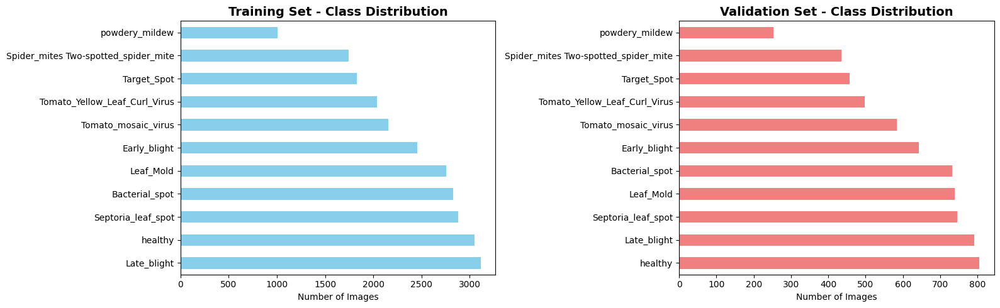


📈 Imbalance Statistics:
   Max class size: 3113
   Min class size: 1004
   Imbalance ratio: 3.10x
   ⚠️  Dataset is imbalanced!

📝 Classes (11):
    1. Bacterial_spot                           →  2826 images
    2. Early_blight                             →  2455 images
    3. Late_blight                              →  3113 images
    4. Leaf_Mold                                →  2754 images
    5. Septoria_leaf_spot                       →  2882 images
    6. Spider_mites Two-spotted_spider_mite     →  1747 images
    7. Target_Spot                              →  1827 images
    8. Tomato_Yellow_Leaf_Curl_Virus            →  2039 images
    9. Tomato_mosaic_virus                      →  2153 images
   10. healthy                                  →  3051 images
   11. powdery_mildew                           →  1004 images


In [16]:
# ============================================================================
# CELL 2: Find and Analyze Dataset (FIXED)
# ============================================================================

# First, let's find the correct dataset path
print("="*70)
print("LOCATING DATASET")
print("="*70)

# Check common Kaggle paths
possible_paths = [
    "/kaggle/input/tomato",
    "/kaggle/input/tomato/train",
    "/kaggle/input",
]

print("\n🔍 Searching for dataset...")
for path in possible_paths:
    if os.path.exists(path):
        print(f"✓ Found: {path}")
        contents = os.listdir(path)
        print(f"  Contents: {contents[:10]}")  # Show first 10 items

# Let's explore the actual structure
BASE_INPUT = "/kaggle/input/tomato"
if os.path.exists(BASE_INPUT):
    print(f"\n📂 Dataset structure at {BASE_INPUT}:")
    for item in os.listdir(BASE_INPUT):
        item_path = os.path.join(BASE_INPUT, item)
        if os.path.isdir(item_path):
            count = len(os.listdir(item_path))
            print(f"   {item}/ ({count} items)")

# NOW SET THE CORRECT PATHS BASED ON YOUR STRUCTURE
# Your structure appears to be: /kaggle/input/tomato/train/<class_folders>
DATA_PATH = "/kaggle/input/tomato/train"
VALID_PATH = "/kaggle/input/tomato/valid"

print(f"\n✅ Using paths:")
print(f"   Train: {DATA_PATH}")
print(f"   Valid: {VALID_PATH}")

def analyze_dataset(base_path):
    """Analyze dataset structure and class distribution"""
    class_counts = {}
    all_images = []
    
    print(f"\n🔍 Analyzing: {base_path}")
    
    if not os.path.exists(base_path):
        print(f"❌ ERROR: Path does not exist: {base_path}")
        return class_counts, all_images
    
    for class_name in os.listdir(base_path):
        class_path = os.path.join(base_path, class_name)
        
        if os.path.isdir(class_path):
            # Count all image files
            images = []
            for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.JPEG', '*.PNG']:
                images.extend(list(Path(class_path).glob(ext)))
            
            # Also try direct listing
            try:
                direct_images = [f for f in os.listdir(class_path) 
                               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                if len(direct_images) > len(images):
                    images = [os.path.join(class_path, img) for img in direct_images]
            except:
                pass
            
            class_counts[class_name] = len(images)
            all_images.extend([(str(img) if isinstance(img, Path) else img, class_name) 
                             for img in images])
            
            print(f"   {class_name}: {len(images)} images")
    
    return class_counts, all_images

# Analyze train and valid datasets
train_counts, train_images = analyze_dataset(DATA_PATH)
valid_counts, valid_images = analyze_dataset(VALID_PATH)

print("\n" + "="*70)
print("DATASET ANALYSIS SUMMARY")
print("="*70)

print("\n📊 TRAIN SET:")
print(f"Total images: {len(train_images)}")
print(f"Number of classes: {len(train_counts)}")
print("\nClass distribution:")
train_df = pd.DataFrame(list(train_counts.items()), columns=['Class', 'Count'])
train_df = train_df.sort_values('Count', ascending=False)
print(train_df.to_string(index=False))

print("\n" + "="*70)
print("\n📊 VALIDATION SET:")
print(f"Total images: {len(valid_images)}")
print(f"Number of classes: {len(valid_counts)}")
print("\nClass distribution:")
valid_df = pd.DataFrame(list(valid_counts.items()), columns=['Class', 'Count'])
valid_df = valid_df.sort_values('Count', ascending=False)
print(valid_df.to_string(index=False))

# Check if we have all expected classes with images
print("\n" + "="*70)
print("DATA QUALITY CHECK")
print("="*70)

# Based on your screenshot, expected counts:
expected_train_counts = {
    'Bacterial_spot': 2826,
    'Early_blight': 2455,
    'Late_blight': 3113,
    'Leaf_Mold': 2754,
    'Septoria_leaf_spot': 2882,
    'Spider_mites Two-spotted_spider_mite': 1747,
    'Target_Spot': 1827,
    'Tomato_Yellow_Leaf_Curl_Virus': 2039,
    'Tomato_mosaic_virus': 2153,
    'healthy': 3051,
    'powdery_mildew': 1004
}

print("\n⚠️  COMPARISON WITH EXPECTED COUNTS:")
print(f"{'Class':<40} {'Expected':>10} {'Found':>10} {'Status':>10}")
print("-" * 75)

for cls, expected in expected_train_counts.items():
    found = train_counts.get(cls, 0)
    status = "✓ OK" if found == expected else "✗ MISMATCH"
    print(f"{cls:<40} {expected:>10} {found:>10} {status:>10}")

total_expected = sum(expected_train_counts.values())
total_found = sum(train_counts.values())
print("-" * 75)
print(f"{'TOTAL':<40} {total_expected:>10} {total_found:>10}")

if total_found != total_expected:
    print(f"\n⚠️  WARNING: Found {total_found} images but expected {total_expected}")
    print(f"   Missing: {total_expected - total_found} images")
    print("\n💡 POSSIBLE CAUSES:")
    print("   1. Dataset not fully uploaded to Kaggle")
    print("   2. Different dataset version")
    print("   3. Files in unexpected format")
    print("   4. Folder structure different than expected")
else:
    print("\n✅ All images found correctly!")

# Visualize class distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

train_df.plot(kind='barh', x='Class', y='Count', ax=axes[0], color='skyblue', legend=False)
axes[0].set_title('Training Set - Class Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Number of Images')
axes[0].set_ylabel('')

valid_df.plot(kind='barh', x='Class', y='Count', ax=axes[1], color='lightcoral', legend=False)
axes[1].set_title('Validation Set - Class Distribution', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Number of Images')
axes[1].set_ylabel('')

plt.tight_layout()
plt.savefig('class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# Calculate imbalance ratio
total_train = sum(train_counts.values())
max_class = max(train_counts.values()) if train_counts else 0
min_class = min([v for v in train_counts.values() if v > 0]) if train_counts else 0
imbalance_ratio = max_class / min_class if min_class > 0 else 0

print(f"\n📈 Imbalance Statistics:")
print(f"   Max class size: {max_class}")
print(f"   Min class size: {min_class}")
print(f"   Imbalance ratio: {imbalance_ratio:.2f}x")
print(f"   {'⚠️  Dataset is imbalanced!' if imbalance_ratio > 2 else '✅ Dataset is balanced'}")

# Store class names
class_names = sorted(list(train_counts.keys()))
print(f"\n📝 Classes ({len(class_names)}):")
for i, cls in enumerate(class_names, 1):
    count = train_counts[cls]
    print(f"   {i:2d}. {cls:<40} → {count:>5} images")

In [17]:
# Cell 3: Create Train/Test/Valid Split (70/15/15)

OUTPUT_DIR = "/kaggle/working/tomato_split"

def create_stratified_split(source_train, source_valid, output_dir, 
                           train_ratio=0.70, test_ratio=0.15, valid_ratio=0.15):
    """
    Create a stratified train/test/valid split from existing train and valid folders.
    Recommended split: 70% train, 15% test, 15% validation
    """
    
    # Combine all images
    all_images = train_images + valid_images
    
    # Create label mapping
    class_to_idx = {cls: idx for idx, cls in enumerate(class_names)}
    
    # Prepare data
    X = [img[0] for img in all_images]  # image paths
    y = [class_to_idx[img[1]] for img in all_images]  # labels
    
    # First split: separate out training set (70%)
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, train_size=train_ratio, stratify=y, random_state=42
    )
    
    # Second split: divide remaining into test and valid (50-50 of remaining 30%)
    test_size_adjusted = test_ratio / (test_ratio + valid_ratio)
    X_test, X_valid, y_test, y_valid = train_test_split(
        X_temp, y_temp, train_size=test_size_adjusted, stratify=y_temp, random_state=42
    )
    
    # Create directory structure
    splits = {
        'train': (X_train, y_train),
        'test': (X_test, y_test),
        'valid': (X_valid, y_valid)
    }
    
    print("="*70)
    print("CREATING NEW DATASET SPLIT")
    print("="*70)
    print(f"\n📂 Output directory: {output_dir}")
    print(f"\n📊 Split ratios: Train={train_ratio:.0%}, Test={test_ratio:.0%}, Valid={valid_ratio:.0%}")
    
    split_info = {}
    
    for split_name, (X_split, y_split) in splits.items():
        split_dir = os.path.join(output_dir, split_name)
        os.makedirs(split_dir, exist_ok=True)
        
        # Create class folders
        for class_name in class_names:
            os.makedirs(os.path.join(split_dir, class_name), exist_ok=True)
        
        # Copy files
        class_counts = Counter(y_split)
        split_info[split_name] = {}
        
        print(f"\n📁 Creating {split_name.upper()} set...")
        for img_path, label in tqdm(zip(X_split, y_split), total=len(X_split), desc=f"Copying {split_name}"):
            class_name = class_names[label]
            dest_path = os.path.join(split_dir, class_name, os.path.basename(img_path))
            shutil.copy2(img_path, dest_path)
            split_info[split_name][class_name] = split_info[split_name].get(class_name, 0) + 1
    
    # Print summary
    print("\n" + "="*70)
    print("SPLIT SUMMARY")
    print("="*70)
    
    summary_data = []
    for split_name in ['train', 'test', 'valid']:
        total = sum(split_info[split_name].values())
        percentage = (total / len(all_images)) * 100
        summary_data.append({
            'Split': split_name.capitalize(),
            'Images': total,
            'Percentage': f"{percentage:.1f}%"
        })
    
    summary_df = pd.DataFrame(summary_data)
    print(f"\n{summary_df.to_string(index=False)}")
    
    # Class-wise distribution
    print(f"\n{'Class':<25} {'Train':>8} {'Test':>8} {'Valid':>8}")
    print("-" * 55)
    for class_name in class_names:
        train_count = split_info['train'].get(class_name, 0)
        test_count = split_info['test'].get(class_name, 0)
        valid_count = split_info['valid'].get(class_name, 0)
        print(f"{class_name:<25} {train_count:>8} {test_count:>8} {valid_count:>8}")
    
    return split_info, class_to_idx

# Create the split
split_info, class_to_idx = create_stratified_split(DATA_PATH, VALID_PATH, OUTPUT_DIR)

# Save metadata
metadata = {
    'class_names': class_names,
    'class_to_idx': class_to_idx,
    'split_info': split_info,
    'num_classes': len(class_names)
}

with open(os.path.join(OUTPUT_DIR, 'metadata.json'), 'w') as f:
    json.dump(metadata, f, indent=4)

print("\n✅ Dataset split completed successfully!")
print(f"📁 New dataset location: {OUTPUT_DIR}")

CREATING NEW DATASET SPLIT

📂 Output directory: /kaggle/working/tomato_split

📊 Split ratios: Train=70%, Test=15%, Valid=15%

📁 Creating TRAIN set...


Copying train:   0%|          | 0/22773 [00:00<?, ?it/s]


📁 Creating TEST set...


Copying test:   0%|          | 0/4880 [00:00<?, ?it/s]


📁 Creating VALID set...


Copying valid:   0%|          | 0/4881 [00:00<?, ?it/s]


SPLIT SUMMARY

Split  Images Percentage
Train   22773      70.0%
 Test    4880      15.0%
Valid    4881      15.0%

Class                        Train     Test    Valid
-------------------------------------------------------
Bacterial_spot                2491      533      534
Early_blight                  2169      464      465
Late_blight                   2733      586      586
Leaf_Mold                     2445      524      524
Septoria_leaf_spot            2539      544      545
Spider_mites Two-spotted_spider_mite     1527      328      327
Target_Spot                   1599      343      342
Tomato_Yellow_Leaf_Curl_Virus     1776      381      380
Tomato_mosaic_virus           1916      410      411
healthy                       2699      578      579
powdery_mildew                 879      189      188

✅ Dataset split completed successfully!
📁 New dataset location: /kaggle/working/tomato_split


CLASS WEIGHT CALCULATION

Method: EFFECTIVE_NUM

Class                        Count     Weight   Normalized
------------------------------------------------------------
Bacterial_spot                2491     0.7706      0.3816
Early_blight                  2169     0.8714      0.4316
Late_blight                   2733     0.7106      0.3519
Leaf_Mold                     2445     0.7834      0.3879
Septoria_leaf_spot            2539     0.7578      0.3753
Spider_mites Two-spotted_spider_mite     1527     1.1999      0.5942
Target_Spot                   1599     1.1499      0.5694
Tomato_Yellow_Leaf_Curl_Virus     1776     1.0442      0.5171
Tomato_mosaic_virus           1916     0.9745      0.4826
healthy                       2699     0.7183      0.3557
powdery_mildew                 879     2.0193      1.0000

📊 Weight Statistics:
   Min weight: 0.7106
   Max weight: 2.0193
   Mean weight: 1.0000
   Std weight: 0.3620


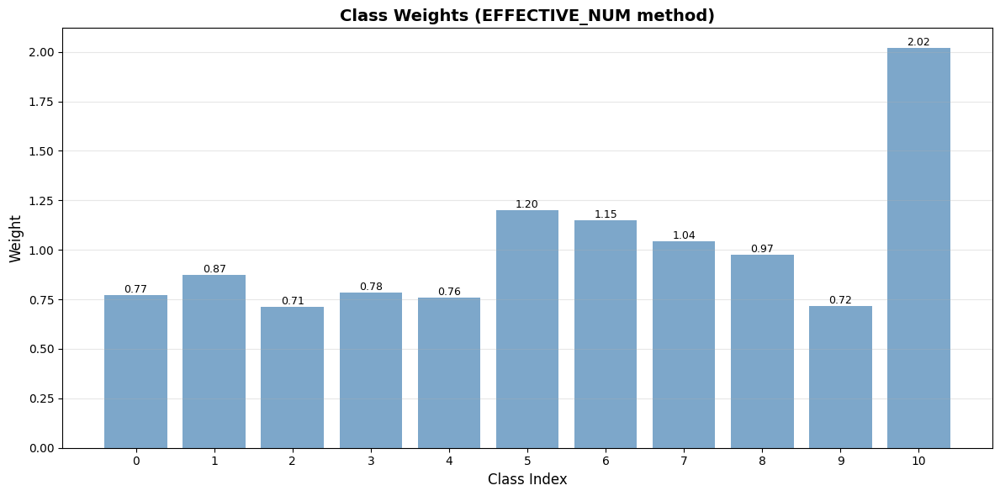


COMPARING WEIGHT CALCULATION METHODS
CLASS WEIGHT CALCULATION

Method: INVERSE

Class                        Count     Weight   Normalized
------------------------------------------------------------
Bacterial_spot                2491     0.7479      0.3529
Early_blight                  2169     0.8589      0.4053
Late_blight                   2733     0.6816      0.3216
Leaf_Mold                     2445     0.7619      0.3595
Septoria_leaf_spot            2539     0.7337      0.3462
Spider_mites Two-spotted_spider_mite     1527     1.2200      0.5756
Target_Spot                   1599     1.1651      0.5497
Tomato_Yellow_Leaf_Curl_Virus     1776     1.0490      0.4949
Tomato_mosaic_virus           1916     0.9723      0.4588
healthy                       2699     0.6902      0.3257
powdery_mildew                 879     2.1194      1.0000

📊 Weight Statistics:
   Min weight: 0.6816
   Max weight: 2.1194
   Mean weight: 1.0000
   Std weight: 0.3977


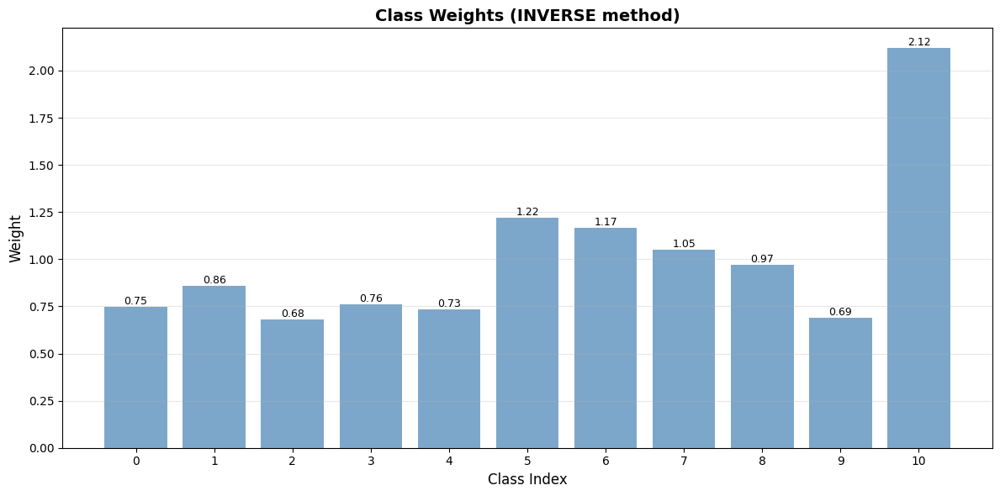

CLASS WEIGHT CALCULATION

Method: EFFECTIVE_NUM

Class                        Count     Weight   Normalized
------------------------------------------------------------
Bacterial_spot                2491     0.7706      0.3816
Early_blight                  2169     0.8714      0.4316
Late_blight                   2733     0.7106      0.3519
Leaf_Mold                     2445     0.7834      0.3879
Septoria_leaf_spot            2539     0.7578      0.3753
Spider_mites Two-spotted_spider_mite     1527     1.1999      0.5942
Target_Spot                   1599     1.1499      0.5694
Tomato_Yellow_Leaf_Curl_Virus     1776     1.0442      0.5171
Tomato_mosaic_virus           1916     0.9745      0.4826
healthy                       2699     0.7183      0.3557
powdery_mildew                 879     2.0193      1.0000

📊 Weight Statistics:
   Min weight: 0.7106
   Max weight: 2.0193
   Mean weight: 1.0000
   Std weight: 0.3620


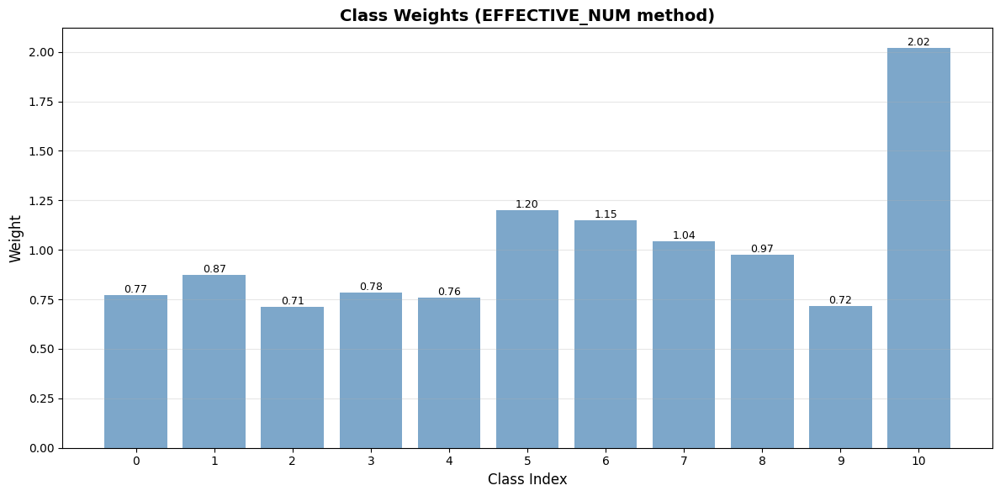

CLASS WEIGHT CALCULATION

Method: SQRT

Class                        Count     Weight   Normalized
------------------------------------------------------------
Bacterial_spot                2491     0.8786      0.5940
Early_blight                  2169     0.9415      0.6366
Late_blight                   2733     0.8388      0.5671
Leaf_Mold                     2445     0.8868      0.5996
Septoria_leaf_spot            2539     0.8702      0.5884
Spider_mites Two-spotted_spider_mite     1527     1.1221      0.7587
Target_Spot                   1599     1.0966      0.7414
Tomato_Yellow_Leaf_Curl_Virus     1776     1.0405      0.7035
Tomato_mosaic_virus           1916     1.0018      0.6773
healthy                       2699     0.8440      0.5707
powdery_mildew                 879     1.4790      1.0000

📊 Weight Statistics:
   Min weight: 0.8388
   Max weight: 1.4790
   Mean weight: 1.0000
   Std weight: 0.1793


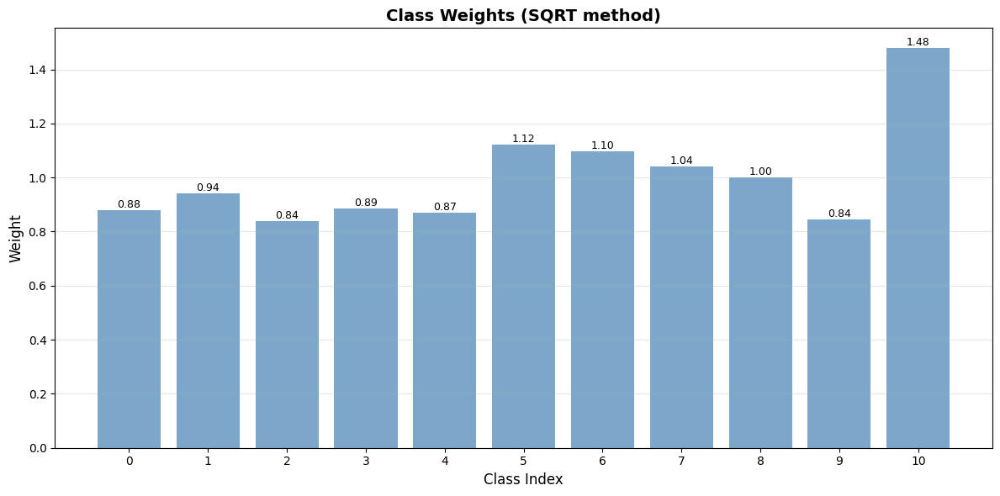


✅ Class weights calculated and saved!


In [18]:
# Cell 4: Calculate Class Weights for Imbalanced Dataset

def calculate_class_weights(split_info, method='effective_num'):
    """
    Calculate class weights for imbalanced dataset
    Methods:
    - 'inverse': Inverse frequency
    - 'effective_num': Effective number of samples (better for imbalanced data)
    - 'sqrt': Square root of inverse frequency
    """
    
    # Get train class counts
    train_counts = split_info['train']
    class_counts = [train_counts[cls] for cls in class_names]
    total_samples = sum(class_counts)
    
    print("="*70)
    print("CLASS WEIGHT CALCULATION")
    print("="*70)
    
    if method == 'inverse':
        # Inverse frequency
        weights = [total_samples / count for count in class_counts]
    
    elif method == 'effective_num':
        # Effective number of samples (better for highly imbalanced)
        beta = 0.9999
        effective_num = [1.0 - np.power(beta, n) for n in class_counts]
        weights = [(1.0 - beta) / en for en in effective_num]
    
    elif method == 'sqrt':
        # Square root inverse
        weights = [np.sqrt(total_samples / count) for count in class_counts]
    
    # Normalize weights
    weights = np.array(weights)
    weights = weights / weights.sum() * len(weights)
    
    # Display results
    print(f"\nMethod: {method.upper()}")
    print(f"\n{'Class':<25} {'Count':>8} {'Weight':>10} {'Normalized':>12}")
    print("-" * 60)
    
    weight_dict = {}
    for i, (cls, count) in enumerate(zip(class_names, class_counts)):
        weight_dict[cls] = float(weights[i])
        print(f"{cls:<25} {count:>8} {weights[i]:>10.4f} {weights[i]/weights.max():>11.4f}")
    
    print(f"\n📊 Weight Statistics:")
    print(f"   Min weight: {weights.min():.4f}")
    print(f"   Max weight: {weights.max():.4f}")
    print(f"   Mean weight: {weights.mean():.4f}")
    print(f"   Std weight: {weights.std():.4f}")
    
    # Visualize weights
    plt.figure(figsize=(12, 6))
    bars = plt.bar(range(len(class_names)), weights, color='steelblue', alpha=0.7)
    plt.xlabel('Class Index', fontsize=12)
    plt.ylabel('Weight', fontsize=12)
    plt.title(f'Class Weights ({method.upper()} method)', fontsize=14, fontweight='bold')
    plt.xticks(range(len(class_names)), [f"{i}" for i in range(len(class_names))], rotation=0)
    plt.grid(axis='y', alpha=0.3)
    
    # Add value labels on bars
    for i, (bar, weight) in enumerate(zip(bars, weights)):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{weight:.2f}', ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.savefig('class_weights.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return torch.FloatTensor(weights), weight_dict

# Calculate weights using effective number method (best for imbalanced data)
class_weights, weight_dict = calculate_class_weights(split_info, method='effective_num')

# Also calculate using other methods for comparison
print("\n" + "="*70)
print("COMPARING WEIGHT CALCULATION METHODS")
print("="*70)

methods_comparison = {}
for method in ['inverse', 'effective_num', 'sqrt']:
    weights_temp, _ = calculate_class_weights(split_info, method=method)
    methods_comparison[method] = weights_temp.numpy()

# Save weights
weights_data = {
    'class_weights': weight_dict,
    'class_weights_tensor': class_weights.tolist(),
    'methods_comparison': {k: v.tolist() for k, v in methods_comparison.items()}
}

with open(os.path.join(OUTPUT_DIR, 'class_weights.json'), 'w') as f:
    json.dump(weights_data, f, indent=4)

print("\n✅ Class weights calculated and saved!")

In [19]:
# Cell 5: Focal Loss Implementation

class FocalLoss(nn.Module):
    """
    Focal Loss for addressing class imbalance
    Loss(x, class) = -alpha * (1 - softmax(x)[class])^gamma * log(softmax(x)[class])
    
    Args:
        alpha: Class weights (Tensor of shape [num_classes])
        gamma: Focusing parameter (default: 2.0)
        reduction: 'mean', 'sum' or 'none'
    """
    
    def __init__(self, alpha=None, gamma=2.0, reduction='mean', label_smoothing=0.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        self.label_smoothing = label_smoothing
    
    def forward(self, inputs, targets):
        """
        Args:
            inputs: (N, C) where C = number of classes
            targets: (N) where each value is 0 <= targets[i] <= C-1
        """
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', 
                                   label_smoothing=self.label_smoothing)
        pt = torch.exp(-ce_loss)
        focal_loss = (1 - pt) ** self.gamma * ce_loss
        
        if self.alpha is not None:
            if self.alpha.device != inputs.device:
                self.alpha = self.alpha.to(inputs.device)
            alpha_t = self.alpha[targets]
            focal_loss = alpha_t * focal_loss
        
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

# Test focal loss
print("="*70)
print("FOCAL LOSS CONFIGURATION")
print("="*70)

focal_loss = FocalLoss(alpha=class_weights, gamma=2.0, label_smoothing=0.1)
print(f"\n✅ Focal Loss initialized:")
print(f"   Alpha (class weights): {class_weights.shape}")
print(f"   Gamma: 2.0")
print(f"   Label Smoothing: 0.1")
print(f"   Reduction: mean")

# Demonstrate focal loss behavior
print(f"\n📊 Focal Loss Properties:")
print(f"   - Focuses on hard-to-classify examples")
print(f"   - Down-weights easy examples (high confidence)")
print(f"   - Up-weights hard examples (low confidence)")
print(f"   - Alpha balances class importance")
print(f"   - Gamma controls focusing strength (higher = more focus on hard)")

# Simulate loss values
dummy_logits = torch.randn(8, len(class_names))
dummy_targets = torch.randint(0, len(class_names), (8,))

with torch.no_grad():
    test_loss = focal_loss(dummy_logits, dummy_targets)
    ce_loss = F.cross_entropy(dummy_logits, dummy_targets)
    
print(f"\n🧪 Test (dummy data):")
print(f"   Focal Loss: {test_loss.item():.4f}")
print(f"   Cross Entropy Loss: {ce_loss.item():.4f}")

FOCAL LOSS CONFIGURATION

✅ Focal Loss initialized:
   Alpha (class weights): torch.Size([11])
   Gamma: 2.0
   Label Smoothing: 0.1
   Reduction: mean

📊 Focal Loss Properties:
   - Focuses on hard-to-classify examples
   - Down-weights easy examples (high confidence)
   - Up-weights hard examples (low confidence)
   - Alpha balances class importance
   - Gamma controls focusing strength (higher = more focus on hard)

🧪 Test (dummy data):
   Focal Loss: 3.5704
   Cross Entropy Loss: 2.6923


DATA AUGMENTATION PIPELINE

🔧 TRAINING AUGMENTATIONS:
   ✓ Random Crop (256 → 224)
   ✓ Horizontal Flip (p=0.5)
   ✓ Vertical Flip (p=0.3)
   ✓ Rotation (±45°, p=0.5)
   ✓ Shift-Scale-Rotate (p=0.5)
   ✓ Random Brightness & Contrast (±30%, p=0.8)
   ✓ Hue-Saturation-Value adjustment (p=0.8)
   ✓ Color Jitter (p=0.8)
   ✓ Gaussian/Median Blur + Noise (p=0.3)
   ✓ Optical/Grid/Elastic Distortion (p=0.2)
   ✓ CoarseDropout/Cutout (p=0.3)
   ✓ MixUp (alpha=0.2, applied in training loop)

🔧 VALIDATION/TEST TRANSFORMS:
   ✓ Resize to 224x224
   ✓ Normalize (ImageNet stats)

✅ Augmentation pipeline initialized!
   Image size: 224x224


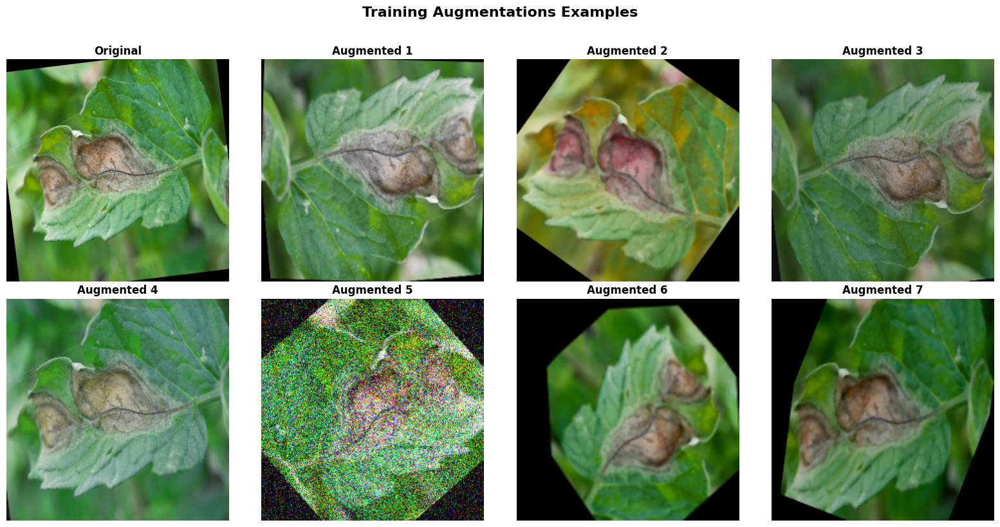

In [20]:
# Cell 6: Advanced Data Augmentation Pipeline

class MixUp:
    """MixUp augmentation"""
    def __init__(self, alpha=0.2):
        self.alpha = alpha
    
    def __call__(self, batch_x, batch_y):
        if self.alpha > 0:
            lam = np.random.beta(self.alpha, self.alpha)
        else:
            lam = 1
        
        batch_size = batch_x.size(0)
        index = torch.randperm(batch_size).to(batch_x.device)
        
        mixed_x = lam * batch_x + (1 - lam) * batch_x[index]
        y_a, y_b = batch_y, batch_y[index]
        
        return mixed_x, y_a, y_b, lam

def get_train_transforms(img_size=224):
    """
    Comprehensive training augmentation pipeline
    Includes: rotation, flip, brightness, contrast, random crop, etc.
    """
    return A.Compose([
        A.Resize(img_size + 32, img_size + 32),
        A.RandomCrop(img_size, img_size),
        
        # Geometric augmentations
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.3),
        A.Rotate(limit=45, p=0.5, border_mode=cv2.BORDER_CONSTANT, value=0),
        A.ShiftScaleRotate(
            shift_limit=0.1, 
            scale_limit=0.2, 
            rotate_limit=30, 
            p=0.5,
            border_mode=cv2.BORDER_CONSTANT
        ),
        
        # Color augmentations
        A.OneOf([
            A.RandomBrightnessContrast(
                brightness_limit=0.3, 
                contrast_limit=0.3, 
                p=1.0
            ),
            A.HueSaturationValue(
                hue_shift_limit=20, 
                sat_shift_limit=30, 
                val_shift_limit=20, 
                p=1.0
            ),
            A.ColorJitter(
                brightness=0.2, 
                contrast=0.2, 
                saturation=0.2, 
                hue=0.1, 
                p=1.0
            ),
        ], p=0.8),
        
        # Blur and noise
        A.OneOf([
            A.GaussianBlur(blur_limit=(3, 7), p=1.0),
            A.MedianBlur(blur_limit=5, p=1.0),
            A.GaussNoise(var_limit=(10.0, 50.0), p=1.0),
        ], p=0.3),
        
        # Advanced augmentations
        A.OneOf([
            A.OpticalDistortion(distort_limit=0.1, p=1.0),
            A.GridDistortion(num_steps=5, distort_limit=0.1, p=1.0),
            A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=1.0),
        ], p=0.2),
        
        # Cutout / CoarseDropout
        A.CoarseDropout(
            max_holes=8, 
            max_height=32, 
            max_width=32, 
            min_holes=1,
            min_height=8, 
            min_width=8,
            fill_value=0,
            p=0.3
        ),
        
        # Normalize
        A.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
            max_pixel_value=255.0,
        ),
        ToTensorV2()
    ])

def get_valid_transforms(img_size=224):
    """Validation/Test transforms - only resize and normalize"""
    return A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
            max_pixel_value=255.0,
        ),
        ToTensorV2()
    ])

# Initialize transforms
IMG_SIZE = 224
train_transforms = get_train_transforms(IMG_SIZE)
valid_transforms = get_valid_transforms(IMG_SIZE)

print("="*70)
print("DATA AUGMENTATION PIPELINE")
print("="*70)

print("\n🔧 TRAINING AUGMENTATIONS:")
print("   ✓ Random Crop (256 → 224)")
print("   ✓ Horizontal Flip (p=0.5)")
print("   ✓ Vertical Flip (p=0.3)")
print("   ✓ Rotation (±45°, p=0.5)")
print("   ✓ Shift-Scale-Rotate (p=0.5)")
print("   ✓ Random Brightness & Contrast (±30%, p=0.8)")
print("   ✓ Hue-Saturation-Value adjustment (p=0.8)")
print("   ✓ Color Jitter (p=0.8)")
print("   ✓ Gaussian/Median Blur + Noise (p=0.3)")
print("   ✓ Optical/Grid/Elastic Distortion (p=0.2)")
print("   ✓ CoarseDropout/Cutout (p=0.3)")
print("   ✓ MixUp (alpha=0.2, applied in training loop)")

print("\n🔧 VALIDATION/TEST TRANSFORMS:")
print("   ✓ Resize to 224x224")
print("   ✓ Normalize (ImageNet stats)")

print(f"\n✅ Augmentation pipeline initialized!")
print(f"   Image size: {IMG_SIZE}x{IMG_SIZE}")

# Visualize augmentations
sample_img_path = train_images[0][0]
sample_img = cv2.imread(sample_img_path)
sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

# Original
axes[0].imshow(sample_img)
axes[0].set_title('Original', fontweight='bold')
axes[0].axis('off')

# Apply augmentations multiple times
for i in range(1, 8):
    augmented = train_transforms(image=sample_img)['image']
    # Denormalize for visualization
    aug_img = augmented.permute(1, 2, 0).numpy()
    aug_img = aug_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    aug_img = np.clip(aug_img, 0, 1)
    
    axes[i].imshow(aug_img)
    axes[i].set_title(f'Augmented {i}', fontweight='bold')
    axes[i].axis('off')

plt.suptitle('Training Augmentations Examples', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('augmentations_preview.png', dpi=300, bbox_inches='tight')
plt.show()

DATASET LOADING

📊 Dataset Sizes:
   Train: 5,972 images
   Valid: 1,278 images
   Test:  1,275 images
   Total: 8,525 images

🏷️  Number of classes: 11

🧪 Sample data:
   Image shape: torch.Size([3, 224, 224])
   Image dtype: torch.float32
   Label: 0 (Bacterial_spot)
   Image range: [-2.118, 1.341]


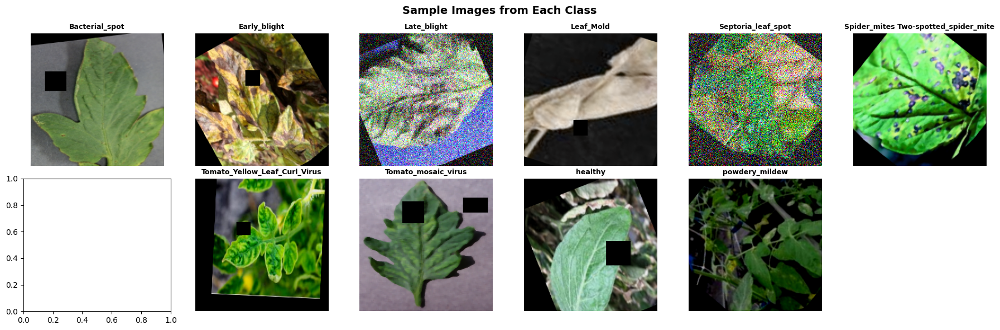


✅ Datasets created successfully!


In [21]:
# Cell 7: Custom Dataset Class

class TomatoDataset(Dataset):
    """Custom Dataset for Tomato Leaf Disease Classification"""
    
    def __init__(self, root_dir, class_names, transform=None):
        """
        Args:
            root_dir: Path to dataset directory (train/test/valid)
            class_names: List of class names
            transform: Albumentations transforms
        """
        self.root_dir = root_dir
        self.class_names = class_names
        self.transform = transform
        self.class_to_idx = {cls: idx for idx, cls in enumerate(class_names)}
        
        # Load all image paths and labels
        self.samples = []
        for class_name in class_names:
            class_dir = os.path.join(root_dir, class_name)
            if not os.path.exists(class_dir):
                continue
            
            for img_name in os.listdir(class_dir):
                if img_name.endswith(('.jpg', '.jpeg', '.png')):
                    img_path = os.path.join(class_dir, img_name)
                    label = self.class_to_idx[class_name]
                    self.samples.append((img_path, label))
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        
        # Read image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Apply transforms
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']
        
        return image, label

# Create datasets
train_dataset = TomatoDataset(
    root_dir=os.path.join(OUTPUT_DIR, 'train'),
    class_names=class_names,
    transform=train_transforms
)

valid_dataset = TomatoDataset(
    root_dir=os.path.join(OUTPUT_DIR, 'valid'),
    class_names=class_names,
    transform=valid_transforms
)

test_dataset = TomatoDataset(
    root_dir=os.path.join(OUTPUT_DIR, 'test'),
    class_names=class_names,
    transform=valid_transforms
)

print("="*70)
print("DATASET LOADING")
print("="*70)

print(f"\n📊 Dataset Sizes:")
print(f"   Train: {len(train_dataset):,} images")
print(f"   Valid: {len(valid_dataset):,} images")
print(f"   Test:  {len(test_dataset):,} images")
print(f"   Total: {len(train_dataset) + len(valid_dataset) + len(test_dataset):,} images")

print(f"\n🏷️  Number of classes: {len(class_names)}")

# Test dataset
sample_img, sample_label = train_dataset[0]
print(f"\n🧪 Sample data:")
print(f"   Image shape: {sample_img.shape}")
print(f"   Image dtype: {sample_img.dtype}")
print(f"   Label: {sample_label} ({class_names[sample_label]})")
print(f"   Image range: [{sample_img.min():.3f}, {sample_img.max():.3f}]")

# Visualize samples from each class
n_samples = min(11, len(class_names))
fig, axes = plt.subplots(2, 6, figsize=(18, 6))
axes = axes.ravel()

for i, class_name in enumerate(class_names[:12]):
    if i >= 12:
        break
    
    # Find first sample of this class
    for img, label in train_dataset:
        if label == i:
            # Denormalize
            img_np = img.permute(1, 2, 0).numpy()
            img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            img_np = np.clip(img_np, 0, 1)
            
            axes[i].imshow(img_np)
            axes[i].set_title(class_name, fontsize=9, fontweight='bold')
            axes[i].axis('off')
            break

# Hide empty subplots
for i in range(len(class_names), 12):
    axes[i].axis('off')

plt.suptitle('Sample Images from Each Class', fontsize=14, fontweight='bold', y=0.98)
plt.tight_layout()
plt.savefig('class_samples.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Datasets created successfully!")

DATA LOADERS - MEMORY OPTIMIZED

⚠️  Batch size reduced to 16 for T4 GPU memory constraints
   This is compensated by gradient accumulation in training

⚙️  Configuration:
   Batch size (per GPU): 16
   Number of workers: 4
   Pin memory: True
   Persistent workers: True (faster epoch transitions)

📦 Batches per epoch:
   Train: 373 batches
   Valid: 80 batches
   Test:  80 batches

🖥️  Multi-GPU Setup:
   Available GPUs: 2
   Effective batch size (before grad accum): 32
   Training will use DataParallel across 2 GPUs
      GPU 0: Tesla T4 (14.7 GB)
      GPU 1: Tesla T4 (14.7 GB)

🧪 Test batch:
   Images shape: torch.Size([16, 3, 224, 224])
   Labels shape: torch.Size([16])
   Batch memory: 9.19 MB


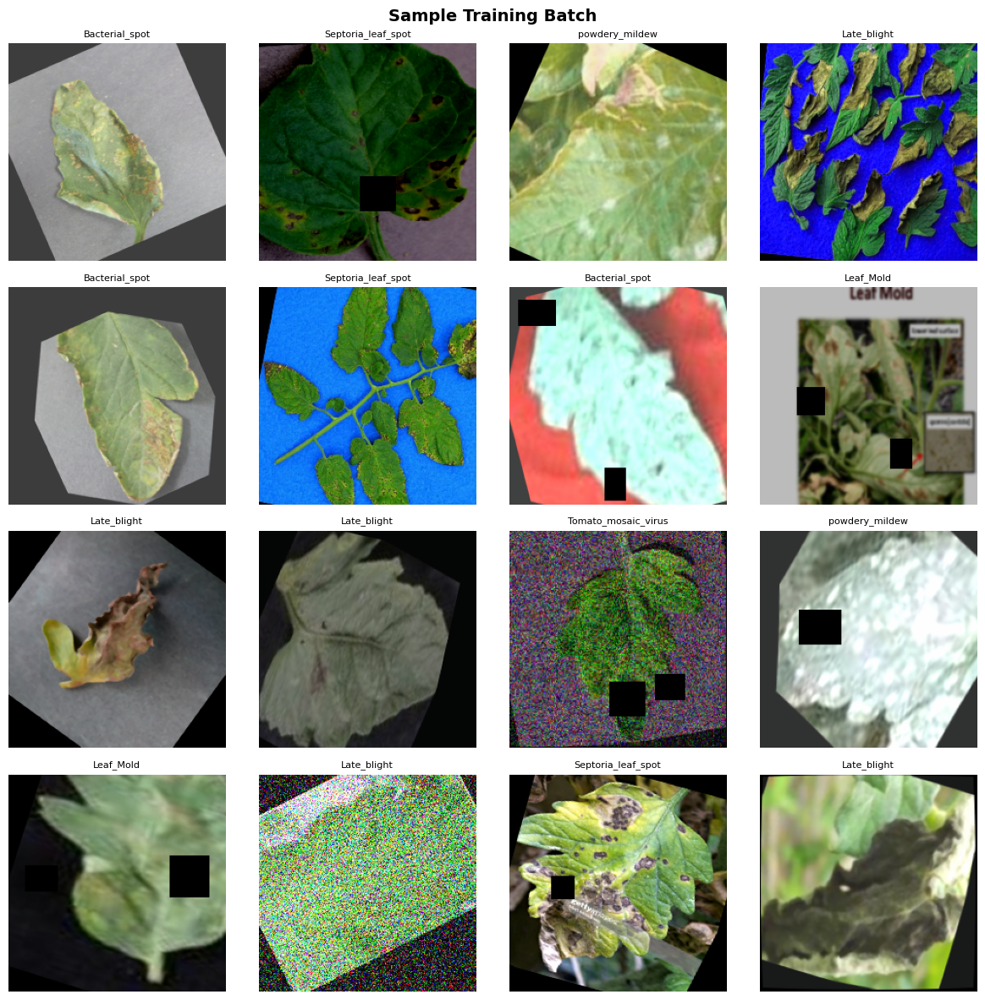


✅ Data loaders created successfully!

💡 Memory Tip: With BATCH_SIZE=16 and gradient accumulation,
   effective batch size will be: 16 × 2 GPUs × 2 (grad accum) = 64


In [28]:
# ============================================================================
# CELL 8: Create Data Loaders (MEMORY OPTIMIZED FOR T4 GPU)
# ============================================================================

# Hyperparameters - OPTIMIZED FOR T4 GPU
BATCH_SIZE = 16  # Reduced from 32 to fit in T4 memory
NUM_WORKERS = 4
PIN_MEMORY = True

print("="*70)
print("DATA LOADERS - MEMORY OPTIMIZED")
print("="*70)

print(f"\n⚠️  Batch size reduced to {BATCH_SIZE} for T4 GPU memory constraints")
print(f"   This is compensated by gradient accumulation in training")

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    drop_last=True,
    persistent_workers=True  # Keep workers alive between epochs
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    persistent_workers=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    persistent_workers=True
)

print(f"\n⚙️  Configuration:")
print(f"   Batch size (per GPU): {BATCH_SIZE}")
print(f"   Number of workers: {NUM_WORKERS}")
print(f"   Pin memory: {PIN_MEMORY}")
print(f"   Persistent workers: True (faster epoch transitions)")

print(f"\n📦 Batches per epoch:")
print(f"   Train: {len(train_loader)} batches")
print(f"   Valid: {len(valid_loader)} batches")
print(f"   Test:  {len(test_loader)} batches")

# Calculate effective batch size for multi-GPU
num_gpus = torch.cuda.device_count()
effective_batch_size = BATCH_SIZE * num_gpus if num_gpus > 0 else BATCH_SIZE

print(f"\n🖥️  Multi-GPU Setup:")
print(f"   Available GPUs: {num_gpus}")
print(f"   Effective batch size (before grad accum): {effective_batch_size}")

if num_gpus > 1:
    print(f"   Training will use DataParallel across {num_gpus} GPUs")
    for i in range(num_gpus):
        gpu_name = torch.cuda.get_device_name(i)
        gpu_memory = torch.cuda.get_device_properties(i).total_memory / 1024**3
        print(f"      GPU {i}: {gpu_name} ({gpu_memory:.1f} GB)")
elif num_gpus == 1:
    gpu_name = torch.cuda.get_device_name(0)
    gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1024**3
    print(f"   Single GPU: {gpu_name} ({gpu_memory:.1f} GB)")

# Test data loader
batch_images, batch_labels = next(iter(train_loader))
print(f"\n🧪 Test batch:")
print(f"   Images shape: {batch_images.shape}")
print(f"   Labels shape: {batch_labels.shape}")
print(f"   Batch memory: {batch_images.element_size() * batch_images.nelement() / 1024**2:.2f} MB")

# Visualize a batch
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.ravel()

samples_to_show = min(16, len(batch_images))

for i in range(samples_to_show):
    img = batch_images[i].permute(1, 2, 0).numpy()
    img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    img = np.clip(img, 0, 1)
    
    label_idx = batch_labels[i].item()
    axes[i].imshow(img)
    axes[i].set_title(class_names[label_idx], fontsize=8)
    axes[i].axis('off')

# Hide unused subplots
for i in range(samples_to_show, 16):
    axes[i].axis('off')

plt.suptitle('Sample Training Batch', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('training_batch.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Data loaders created successfully!")
print(f"\n💡 Memory Tip: With BATCH_SIZE={BATCH_SIZE} and gradient accumulation,")
print(f"   effective batch size will be: {BATCH_SIZE} × {num_gpus if num_gpus > 0 else 1} GPUs × 2 (grad accum) = {effective_batch_size * 2}")

In [33]:
import torch
import torch.nn as nn
import timm

# Simple EVA02-Base classifier
class EVA02Classifier(nn.Module):
    def __init__(self, num_classes=11, dropout=0.3, pretrained=True):
        super().__init__()
        # Load pretrained EVA02 backbone without classifier
        self.backbone = timm.create_model(
            'eva02_base_patch14_224.mim_in22k',
            pretrained=pretrained,
            num_classes=0,
            global_pool='avg'
        )
        self.num_features = self.backbone.num_features

        # Simple classifier head
        self.classifier = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(self.num_features, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.backbone(x)
        return self.classifier(x)

# Model setup
NUM_CLASSES = len(class_names)
DROPOUT = 0.3
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = EVA02Classifier(num_classes=NUM_CLASSES, dropout=DROPOUT)
model = model.to(device)

# Test forward pass
IMG_SIZE = 224
dummy_input = torch.randn(2, 3, IMG_SIZE, IMG_SIZE).to(device)
with torch.no_grad():
    dummy_output = model(dummy_input)

print("Model initialized!")
print(f"Input shape: {dummy_input.shape}, Output shape: {dummy_output.shape}")


Model initialized!
Input shape: torch.Size([2, 3, 224, 224]), Output shape: torch.Size([2, 11])


TRAINING CONFIGURATION

⚙️  Hyperparameters:
   Epochs: 35
   Learning rate: 0.0001
   Weight decay: 0.0001
   Label smoothing: 0.1
   Gradient accumulation: 2 steps
   Effective batch size: 64
   Early stopping patience: 7 epochs

🎯 Loss Function:
   Type: Focal Loss
   Gamma: 2.0
   Class weights: Enabled (effective number method)
   Label smoothing: 0.1

🔀 Data Augmentation:
   MixUp alpha: 0.2
   Augmentation pipeline: Enabled

📉 Optimizer:
   Type: AdamW
   Initial LR: 0.0001
   Weight decay: 0.0001
   Betas: (0.9, 0.999)

📊 LR Scheduler:
   Type: CosineAnnealingLR
   T_max: 35
   Min LR: 1e-6


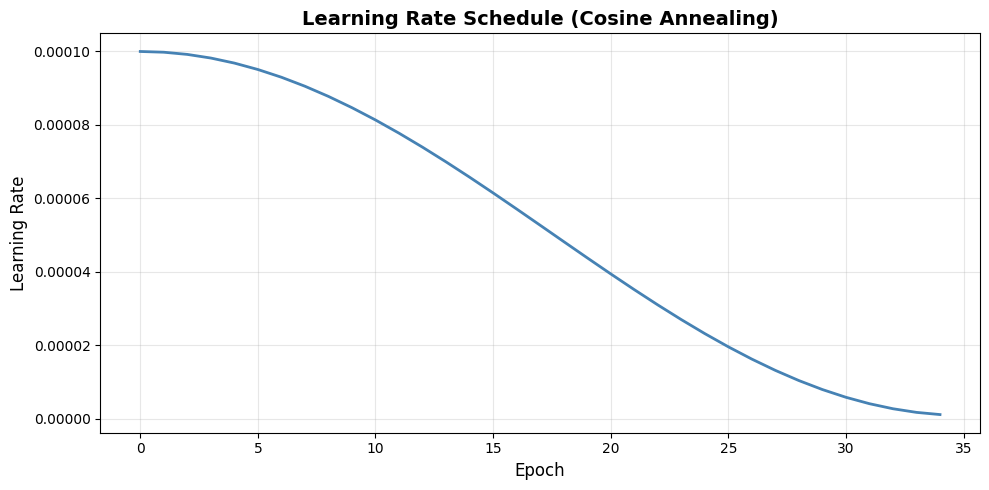


⏹️  Early Stopping:
   Patience: 7 epochs
   Monitoring: Validation loss
   Mode: Minimize

✅ Training configuration complete!


In [35]:
# Cell 10: Training Configuration & Optimizer Setup

# Training hyperparameters
EPOCHS = 35
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-4
LABEL_SMOOTHING = 0.1
GRADIENT_ACCUMULATION_STEPS = 2
PATIENCE = 7  # For early stopping
FOCAL_GAMMA = 2.0

# MixUp configuration
MIXUP_ALPHA = 0.2
mixup = MixUp(alpha=MIXUP_ALPHA)

print("="*70)
print("TRAINING CONFIGURATION")
print("="*70)

print(f"\n⚙️  Hyperparameters:")
print(f"   Epochs: {EPOCHS}")
print(f"   Learning rate: {LEARNING_RATE}")
print(f"   Weight decay: {WEIGHT_DECAY}")
print(f"   Label smoothing: {LABEL_SMOOTHING}")
print(f"   Gradient accumulation: {GRADIENT_ACCUMULATION_STEPS} steps")
print(f"   Effective batch size: {effective_batch_size * GRADIENT_ACCUMULATION_STEPS}")
print(f"   Early stopping patience: {PATIENCE} epochs")

print(f"\n🎯 Loss Function:")
print(f"   Type: Focal Loss")
print(f"   Gamma: {FOCAL_GAMMA}")
print(f"   Class weights: Enabled (effective number method)")
print(f"   Label smoothing: {LABEL_SMOOTHING}")

print(f"\n🔀 Data Augmentation:")
print(f"   MixUp alpha: {MIXUP_ALPHA}")
print(f"   Augmentation pipeline: Enabled")

# Loss function
criterion = FocalLoss(
    alpha=class_weights,
    gamma=FOCAL_GAMMA,
    label_smoothing=LABEL_SMOOTHING
).to(device)

# Optimizer - AdamW with weight decay
optimizer = AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY,
    betas=(0.9, 0.999)
)

# Learning rate scheduler - Cosine Annealing
scheduler = CosineAnnealingLR(
    optimizer,
    T_max=EPOCHS,
    eta_min=1e-6
)

print(f"\n📉 Optimizer:")
print(f"   Type: AdamW")
print(f"   Initial LR: {LEARNING_RATE}")
print(f"   Weight decay: {WEIGHT_DECAY}")
print(f"   Betas: (0.9, 0.999)")

print(f"\n📊 LR Scheduler:")
print(f"   Type: CosineAnnealingLR")
print(f"   T_max: {EPOCHS}")
print(f"   Min LR: 1e-6")

# Visualize learning rate schedule
lrs = []
temp_scheduler = CosineAnnealingLR(
    AdamW(model.parameters(), lr=LEARNING_RATE),
    T_max=EPOCHS,
    eta_min=1e-6
)
for epoch in range(EPOCHS):
    lrs.append(temp_scheduler.get_last_lr()[0])
    temp_scheduler.step()

plt.figure(figsize=(10, 5))
plt.plot(range(EPOCHS), lrs, linewidth=2, color='steelblue')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Learning Rate', fontsize=12)
plt.title('Learning Rate Schedule (Cosine Annealing)', fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('lr_schedule.png', dpi=300, bbox_inches='tight')
plt.show()

# Early stopping configuration
class EarlyStopping:
    """Early stopping to prevent overfitting"""
    
    def __init__(self, patience=7, min_delta=0, mode='min'):
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.best_epoch = 0
        
        if mode == 'min':
            self.monitor_op = lambda x, y: x < y - min_delta
        else:
            self.monitor_op = lambda x, y: x > y + min_delta
    
    def __call__(self, score, epoch):
        if self.best_score is None:
            self.best_score = score
            self.best_epoch = epoch
        elif self.monitor_op(score, self.best_score):
            self.best_score = score
            self.best_epoch = epoch
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        
        return self.early_stop

early_stopping = EarlyStopping(patience=PATIENCE, mode='min')

print(f"\n⏹️  Early Stopping:")
print(f"   Patience: {PATIENCE} epochs")
print(f"   Monitoring: Validation loss")
print(f"   Mode: Minimize")

print("\n✅ Training configuration complete!")

In [36]:
# Cell 11: Training and Validation Functions

def train_epoch(model, loader, criterion, optimizer, device, mixup, grad_accum_steps=1):
    """Train for one epoch"""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    optimizer.zero_grad()
    
    pbar = tqdm(enumerate(loader), total=len(loader), desc='Training')
    
    for batch_idx, (images, labels) in pbar:
        images, labels = images.to(device), labels.to(device)
        
        # Apply MixUp
        if mixup.alpha > 0 and np.random.rand() < 0.5:
            mixed_images, labels_a, labels_b, lam = mixup(images, labels)
            outputs = model(mixed_images)
            loss = lam * criterion(outputs, labels_a) + (1 - lam) * criterion(outputs, labels_b)
        else:
            outputs = model(images)
            loss = criterion(outputs, labels)
        
        # Gradient accumulation
        loss = loss / grad_accum_steps
        loss.backward()
        
        if (batch_idx + 1) % grad_accum_steps == 0:
            # Gradient clipping
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            optimizer.zero_grad()
        
        # Statistics
        running_loss += loss.item() * grad_accum_steps
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
        # Update progress bar
        pbar.set_postfix({
            'loss': f'{running_loss/(batch_idx+1):.4f}',
            'acc': f'{100.*correct/total:.2f}%'
        })
    
    epoch_loss = running_loss / len(loader)
    epoch_acc = 100. * correct / total
    
    return epoch_loss, epoch_acc

def validate(model, loader, criterion, device):
    """Validate the model"""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation')
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            
            pbar.set_postfix({
                'loss': f'{running_loss/(pbar.n+1):.4f}',
                'acc': f'{100.*correct/total:.2f}%'
            })
    
    epoch_loss = running_loss / len(loader)
    epoch_acc = 100. * correct / total
    
    # Calculate F1 score
    f1 = f1_score(all_labels, all_preds, average='weighted')
    
    return epoch_loss, epoch_acc, f1, all_preds, all_labels

def save_checkpoint(model, optimizer, scheduler, epoch, val_loss, val_acc, 
                   filepath='best_model.pth'):
    """Save model checkpoint"""
    
    # Handle DataParallel
    model_state = model.module.state_dict() if hasattr(model, 'module') else model.state_dict()
    
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model_state,
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'val_loss': val_loss,
        'val_acc': val_acc,
        'class_names': class_names,
        'num_classes': NUM_CLASSES
    }
    
    torch.save(checkpoint, filepath)
    print(f"💾 Checkpoint saved: {filepath}")

print("="*70)
print("TRAINING FUNCTIONS")
print("="*70)

print("\n✅ Training functions defined:")
print("   • train_epoch() - Training loop with MixUp & gradient accumulation")
print("   • validate() - Validation loop with metrics")
print("   • save_checkpoint() - Model checkpointing")

print("\n🔧 Features:")
print("   ✓ Gradient accumulation")
print("   ✓ Gradient clipping (max_norm=1.0)")
print("   ✓ MixUp augmentation (50% probability)")
print("   ✓ Progress bars with live metrics")
print("   ✓ F1-score calculation")
print("   ✓ Model checkpointing")

TRAINING FUNCTIONS

✅ Training functions defined:
   • train_epoch() - Training loop with MixUp & gradient accumulation
   • validate() - Validation loop with metrics
   • save_checkpoint() - Model checkpointing

🔧 Features:
   ✓ Gradient accumulation
   ✓ Gradient clipping (max_norm=1.0)
   ✓ MixUp augmentation (50% probability)
   ✓ Progress bars with live metrics
   ✓ F1-score calculation
   ✓ Model checkpointing


In [37]:
# ============================================================================
# CELL 12: Main Training Loop (MEMORY OPTIMIZED)
# ============================================================================

# Clear GPU memory before starting
import gc
torch.cuda.empty_cache()
gc.collect()

print("="*70)
print("MEMORY OPTIMIZATION")
print("="*70)

# Check GPU memory
if torch.cuda.is_available():
    for i in range(torch.cuda.device_count()):
        print(f"\nGPU {i}: {torch.cuda.get_device_name(i)}")
        total_mem = torch.cuda.get_device_properties(i).total_memory / 1024**3
        print(f"   Total memory: {total_mem:.2f} GB")
        allocated = torch.cuda.memory_allocated(i) / 1024**3
        print(f"   Currently allocated: {allocated:.2f} GB")
        reserved = torch.cuda.memory_reserved(i) / 1024**3
        print(f"   Reserved: {reserved:.2f} GB")
        print(f"   Available: {total_mem - reserved:.2f} GB")

# Enable memory efficient settings
torch.backends.cudnn.benchmark = True
if hasattr(torch.cuda, 'memory_efficient_attention'):
    torch.backends.cuda.enable_mem_efficient_sdp(True)

# Use gradient checkpointing if available to save memory
if hasattr(model, 'module'):
    backbone = model.module.backbone
else:
    backbone = model.backbone

# Enable gradient checkpointing for memory efficiency
if hasattr(backbone, 'set_grad_checkpointing'):
    backbone.set_grad_checkpointing(enable=True)
    print("\n✅ Gradient checkpointing enabled")

# Use mixed precision training (AMP) to reduce memory usage
scaler = torch.cuda.amp.GradScaler()
print("✅ Mixed precision training (AMP) enabled")

print("\n" + "="*70)
print("TRAINING START")
print("="*70)
print(f"\n🚀 Starting training for {EPOCHS} epochs...")
print(f"💾 Models will be saved to: /kaggle/working/")
print(f"🔧 Using Mixed Precision Training to reduce memory usage")
print(f"\n" + "="*70 + "\n")

# Training history
history = {
    'train_loss': [],
    'train_acc': [],
    'val_loss': [],
    'val_acc': [],
    'val_f1': [],
    'lr': []
}

best_val_loss = float('inf')
best_val_acc = 0.0

def train_epoch_amp(model, loader, criterion, optimizer, scaler, device, mixup, grad_accum_steps=1):
    """Train for one epoch with Automatic Mixed Precision (AMP)"""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    optimizer.zero_grad()
    
    pbar = tqdm(enumerate(loader), total=len(loader), desc='Training')
    
    for batch_idx, (images, labels) in pbar:
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        
        # Use autocast for mixed precision
        with torch.cuda.amp.autocast():
            # Apply MixUp
            if mixup.alpha > 0 and np.random.rand() < 0.5:
                mixed_images, labels_a, labels_b, lam = mixup(images, labels)
                outputs = model(mixed_images)
                loss = lam * criterion(outputs, labels_a) + (1 - lam) * criterion(outputs, labels_b)
            else:
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            # Gradient accumulation
            loss = loss / grad_accum_steps
        
        # Backward pass with gradient scaling
        scaler.scale(loss).backward()
        
        if (batch_idx + 1) % grad_accum_steps == 0:
            # Gradient clipping
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            # Optimizer step with scaler
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
        
        # Statistics
        running_loss += loss.item() * grad_accum_steps
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
        # Update progress bar
        pbar.set_postfix({
            'loss': f'{running_loss/(batch_idx+1):.4f}',
            'acc': f'{100.*correct/total:.2f}%',
            'mem': f'{torch.cuda.memory_allocated(0)/1024**2:.0f}MB'
        })
        
        # Clear cache periodically
        if (batch_idx + 1) % 50 == 0:
            torch.cuda.empty_cache()
    
    epoch_loss = running_loss / len(loader)
    epoch_acc = 100. * correct / total
    
    return epoch_loss, epoch_acc

def validate_amp(model, loader, criterion, device):
    """Validate the model with AMP"""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation')
        for images, labels in pbar:
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            
            # Use autocast for inference too
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            
            pbar.set_postfix({
                'loss': f'{running_loss/(pbar.n+1):.4f}',
                'acc': f'{100.*correct/total:.2f}%'
            })
    
    epoch_loss = running_loss / len(loader)
    epoch_acc = 100. * correct / total
    
    # Calculate F1 score
    f1 = f1_score(all_labels, all_preds, average='weighted')
    
    return epoch_loss, epoch_acc, f1, all_preds, all_labels

# Training loop
try:
    for epoch in range(EPOCHS):
        print(f"\n{'='*70}")
        print(f"EPOCH {epoch+1}/{EPOCHS}")
        print(f"{'='*70}")
        
        # Current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Learning Rate: {current_lr:.6f}")
        
        # Train with AMP
        train_loss, train_acc = train_epoch_amp(
            model, train_loader, criterion, optimizer, scaler, device, 
            mixup, GRADIENT_ACCUMULATION_STEPS
        )
        
        # Validate with AMP
        val_loss, val_acc, val_f1, _, _ = validate_amp(
            model, valid_loader, criterion, device
        )
        
        # Update learning rate
        scheduler.step()
        
        # Store history
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_f1'].append(val_f1)
        history['lr'].append(current_lr)
        
        # Print epoch summary
        print(f"\n{'='*70}")
        print(f"EPOCH {epoch+1} SUMMARY")
        print(f"{'='*70}")
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
        print(f"Val Loss:   {val_loss:.4f} | Val Acc:   {val_acc:.2f}%")
        print(f"Val F1:     {val_f1:.4f}")
        
        # Save best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_val_acc = val_acc
            save_checkpoint(
                model, optimizer, scheduler, epoch, val_loss, val_acc,
                filepath='/kaggle/working/best_model_loss.pth'
            )
            print(f"🎯 New best validation loss: {val_loss:.4f}")
        
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            save_checkpoint(
                model, optimizer, scheduler, epoch, val_loss, val_acc,
                filepath='/kaggle/working/best_model_acc.pth'
            )
            print(f"🎯 New best validation accuracy: {val_acc:.2f}%")
        
        # Save latest checkpoint
        if (epoch + 1) % 5 == 0:
            save_checkpoint(
                model, optimizer, scheduler, epoch, val_loss, val_acc,
                filepath=f'/kaggle/working/checkpoint_epoch_{epoch+1}.pth'
            )
        
        # Early stopping check
        if early_stopping(val_loss, epoch):
            print(f"\n⏹️  Early stopping triggered!")
            print(f"   Best epoch: {early_stopping.best_epoch + 1}")
            print(f"   Best val loss: {early_stopping.best_score:.4f}")
            print(f"   No improvement for {PATIENCE} epochs")
            break
        
        # GPU memory info
        if torch.cuda.is_available():
            allocated = torch.cuda.memory_allocated(0) / 1024**2
            peak = torch.cuda.max_memory_allocated(0) / 1024**2
            print(f"\n💻 GPU 0 Memory: {allocated:.0f} MB / {peak:.0f} MB (peak)")
            
            if torch.cuda.device_count() > 1:
                allocated2 = torch.cuda.memory_allocated(1) / 1024**2
                peak2 = torch.cuda.max_memory_allocated(1) / 1024**2
                print(f"💻 GPU 1 Memory: {allocated2:.0f} MB / {peak2:.0f} MB (peak)")
            
            # Clear cache
            torch.cuda.empty_cache()
            gc.collect()

except RuntimeError as e:
    if "out of memory" in str(e):
        print("\n" + "="*70)
        print("⚠️  OUT OF MEMORY ERROR")
        print("="*70)
        print("\n❌ Training stopped due to insufficient GPU memory.")
        print("\n💡 Solutions:")
        print("   1. Reduce BATCH_SIZE further (currently 32)")
        print("   2. Increase GRADIENT_ACCUMULATION_STEPS (currently 2)")
        print("   3. Use a smaller model (try EVA02-small instead of base)")
        print("   4. Reduce image size (currently 224)")
        print("\n📝 Recommended settings for T4 GPU:")
        print("   BATCH_SIZE = 16")
        print("   GRADIENT_ACCUMULATION_STEPS = 4")
        print("   IMG_SIZE = 224")
        raise
    else:
        raise

print(f"\n{'='*70}")
print("TRAINING COMPLETE!")
print(f"{'='*70}")
print(f"\n🏆 Best Results:")
print(f"   Best Val Loss: {best_val_loss:.4f}")
print(f"   Best Val Acc:  {best_val_acc:.2f}%")
print(f"\n💾 Saved models:")
print(f"   • best_model_loss.pth")
print(f"   • best_model_acc.pth")
print(f"   • checkpoint_epoch_*.pth")

# Save training history
history_df = pd.DataFrame(history)
history_df.to_csv('/kaggle/working/training_history.csv', index=False)
print(f"\n📊 Training history saved to: training_history.csv")

# Final memory cleanup
torch.cuda.empty_cache()
gc.collect()
print("\n✅ Training session completed and memory cleaned!")

MEMORY OPTIMIZATION

GPU 0: Tesla T4
   Total memory: 14.74 GB
   Currently allocated: 1.00 GB
   Reserved: 1.47 GB
   Available: 13.27 GB

GPU 1: Tesla T4
   Total memory: 14.74 GB
   Currently allocated: 0.01 GB
   Reserved: 0.38 GB
   Available: 14.36 GB

✅ Gradient checkpointing enabled
✅ Mixed precision training (AMP) enabled

TRAINING START

🚀 Starting training for 35 epochs...
💾 Models will be saved to: /kaggle/working/
🔧 Using Mixed Precision Training to reduce memory usage



EPOCH 1/35
Learning Rate: 0.000100


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 1 SUMMARY
Train Loss: 0.9181 | Train Acc: 47.00%
Val Loss:   0.4847 | Val Acc:   78.72%
Val F1:     0.7867
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.4847

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 2/35
Learning Rate: 0.000100


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 2 SUMMARY
Train Loss: 0.6176 | Train Acc: 61.90%
Val Loss:   0.3019 | Val Acc:   87.72%
Val F1:     0.8774
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.3019

💻 GPU 0 Memory: 1686 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 3/35
Learning Rate: 0.000099


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 3 SUMMARY
Train Loss: 0.5215 | Train Acc: 64.34%
Val Loss:   0.2739 | Val Acc:   87.87%
Val F1:     0.8770
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.2739

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 4/35
Learning Rate: 0.000098


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 4 SUMMARY
Train Loss: 0.5156 | Train Acc: 66.22%
Val Loss:   0.2854 | Val Acc:   86.31%
Val F1:     0.8614

💻 GPU 0 Memory: 1688 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 5/35
Learning Rate: 0.000097


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 5 SUMMARY
Train Loss: 0.4084 | Train Acc: 70.19%
Val Loss:   0.2063 | Val Acc:   93.58%
Val F1:     0.9365
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.2063
💾 Checkpoint saved: /kaggle/working/checkpoint_epoch_5.pth

💻 GPU 0 Memory: 1688 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 6/35
Learning Rate: 0.000095


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 6 SUMMARY
Train Loss: 0.4103 | Train Acc: 70.44%
Val Loss:   0.2062 | Val Acc:   92.96%
Val F1:     0.9291
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.2062

💻 GPU 0 Memory: 1691 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 7/35
Learning Rate: 0.000093


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 7 SUMMARY
Train Loss: 0.3830 | Train Acc: 70.91%
Val Loss:   0.1941 | Val Acc:   93.43%
Val F1:     0.9354
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1941

💻 GPU 0 Memory: 1686 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 8/35
Learning Rate: 0.000091


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 8 SUMMARY
Train Loss: 0.3664 | Train Acc: 74.08%
Val Loss:   0.2466 | Val Acc:   93.04%
Val F1:     0.9291

💻 GPU 0 Memory: 1691 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 9/35
Learning Rate: 0.000088


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 9 SUMMARY
Train Loss: 0.3665 | Train Acc: 71.21%
Val Loss:   0.2083 | Val Acc:   92.96%
Val F1:     0.9288

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 10/35
Learning Rate: 0.000085


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 10 SUMMARY
Train Loss: 0.3346 | Train Acc: 73.46%
Val Loss:   0.1665 | Val Acc:   95.31%
Val F1:     0.9532
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1665
💾 Checkpoint saved: /kaggle/working/checkpoint_epoch_10.pth

💻 GPU 0 Memory: 1686 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 11/35
Learning Rate: 0.000081


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 11 SUMMARY
Train Loss: 0.3310 | Train Acc: 71.58%
Val Loss:   0.1555 | Val Acc:   96.48%
Val F1:     0.9650
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1555

💻 GPU 0 Memory: 1688 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 12/35
Learning Rate: 0.000078


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 12 SUMMARY
Train Loss: 0.3356 | Train Acc: 74.46%
Val Loss:   0.1959 | Val Acc:   94.29%
Val F1:     0.9457

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 13/35
Learning Rate: 0.000074


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 13 SUMMARY
Train Loss: 0.3029 | Train Acc: 72.82%
Val Loss:   0.1560 | Val Acc:   95.93%
Val F1:     0.9585

💻 GPU 0 Memory: 1691 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 14/35
Learning Rate: 0.000070


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 14 SUMMARY
Train Loss: 0.3108 | Train Acc: 75.94%
Val Loss:   0.1478 | Val Acc:   96.17%
Val F1:     0.9616
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1478

💻 GPU 0 Memory: 1688 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 15/35
Learning Rate: 0.000066


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 15 SUMMARY
Train Loss: 0.2883 | Train Acc: 76.89%
Val Loss:   0.1383 | Val Acc:   97.03%
Val F1:     0.9703
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1383
💾 Checkpoint saved: /kaggle/working/checkpoint_epoch_15.pth

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 16/35
Learning Rate: 0.000062


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 16 SUMMARY
Train Loss: 0.2613 | Train Acc: 76.73%
Val Loss:   0.1571 | Val Acc:   96.40%
Val F1:     0.9642

💻 GPU 0 Memory: 1689 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 17/35
Learning Rate: 0.000057


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 17 SUMMARY
Train Loss: 0.2603 | Train Acc: 76.52%
Val Loss:   0.1416 | Val Acc:   96.32%
Val F1:     0.9636

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 18/35
Learning Rate: 0.000053


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 18 SUMMARY
Train Loss: 0.2574 | Train Acc: 76.73%
Val Loss:   0.1445 | Val Acc:   97.03%
Val F1:     0.9701

💻 GPU 0 Memory: 1688 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 19/35
Learning Rate: 0.000048


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 19 SUMMARY
Train Loss: 0.2592 | Train Acc: 78.99%
Val Loss:   0.1540 | Val Acc:   96.17%
Val F1:     0.9612

💻 GPU 0 Memory: 1691 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 20/35
Learning Rate: 0.000044


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 20 SUMMARY
Train Loss: 0.2622 | Train Acc: 74.77%
Val Loss:   0.1340 | Val Acc:   96.87%
Val F1:     0.9684
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1340
💾 Checkpoint saved: /kaggle/working/checkpoint_epoch_20.pth

💻 GPU 0 Memory: 1688 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 21/35
Learning Rate: 0.000039


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 21 SUMMARY
Train Loss: 0.2310 | Train Acc: 80.11%
Val Loss:   0.1471 | Val Acc:   96.48%
Val F1:     0.9647

💻 GPU 0 Memory: 1689 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 22/35
Learning Rate: 0.000035


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 22 SUMMARY
Train Loss: 0.2255 | Train Acc: 80.80%
Val Loss:   0.1336 | Val Acc:   97.34%
Val F1:     0.9731
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1336

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 23/35
Learning Rate: 0.000031


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 23 SUMMARY
Train Loss: 0.2245 | Train Acc: 79.83%
Val Loss:   0.1276 | Val Acc:   97.57%
Val F1:     0.9756
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1276

💻 GPU 0 Memory: 1691 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 24/35
Learning Rate: 0.000027


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 24 SUMMARY
Train Loss: 0.2253 | Train Acc: 75.64%
Val Loss:   0.1392 | Val Acc:   97.18%
Val F1:     0.9716

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 25/35
Learning Rate: 0.000023


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 25 SUMMARY
Train Loss: 0.2382 | Train Acc: 80.21%
Val Loss:   0.1332 | Val Acc:   96.95%
Val F1:     0.9692
💾 Checkpoint saved: /kaggle/working/checkpoint_epoch_25.pth

💻 GPU 0 Memory: 1687 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 26/35
Learning Rate: 0.000020


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 26 SUMMARY
Train Loss: 0.2405 | Train Acc: 80.19%
Val Loss:   0.1304 | Val Acc:   97.50%
Val F1:     0.9747

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 27/35
Learning Rate: 0.000016


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 27 SUMMARY
Train Loss: 0.2160 | Train Acc: 80.65%
Val Loss:   0.1358 | Val Acc:   97.57%
Val F1:     0.9755

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 28/35
Learning Rate: 0.000013


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 28 SUMMARY
Train Loss: 0.2096 | Train Acc: 80.06%
Val Loss:   0.1265 | Val Acc:   97.73%
Val F1:     0.9772
💾 Checkpoint saved: /kaggle/working/best_model_loss.pth
🎯 New best validation loss: 0.1265

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 29/35
Learning Rate: 0.000010


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 29 SUMMARY
Train Loss: 0.2247 | Train Acc: 79.16%
Val Loss:   0.1345 | Val Acc:   97.34%
Val F1:     0.9733

💻 GPU 0 Memory: 1688 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 30/35
Learning Rate: 0.000008


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 30 SUMMARY
Train Loss: 0.2045 | Train Acc: 82.91%
Val Loss:   0.1314 | Val Acc:   97.50%
Val F1:     0.9749
💾 Checkpoint saved: /kaggle/working/checkpoint_epoch_30.pth

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 31/35
Learning Rate: 0.000006


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 31 SUMMARY
Train Loss: 0.2180 | Train Acc: 76.46%
Val Loss:   0.1327 | Val Acc:   97.42%
Val F1:     0.9740

💻 GPU 0 Memory: 1688 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 32/35
Learning Rate: 0.000004


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 32 SUMMARY
Train Loss: 0.2250 | Train Acc: 80.19%
Val Loss:   0.1334 | Val Acc:   97.50%
Val F1:     0.9748

💻 GPU 0 Memory: 1685 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 33/35
Learning Rate: 0.000003


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 33 SUMMARY
Train Loss: 0.2083 | Train Acc: 77.25%
Val Loss:   0.1323 | Val Acc:   97.50%
Val F1:     0.9748

💻 GPU 0 Memory: 1691 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 34/35
Learning Rate: 0.000002


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 34 SUMMARY
Train Loss: 0.2117 | Train Acc: 78.94%
Val Loss:   0.1327 | Val Acc:   97.57%
Val F1:     0.9756

💻 GPU 0 Memory: 1686 MB / 6435 MB (peak)
💻 GPU 1 Memory: 8 MB / 358 MB (peak)

EPOCH 35/35
Learning Rate: 0.000001


Training:   0%|          | 0/373 [00:00<?, ?it/s]

Validation:   0%|          | 0/80 [00:00<?, ?it/s]


EPOCH 35 SUMMARY
Train Loss: 0.2317 | Train Acc: 76.73%
Val Loss:   0.1317 | Val Acc:   97.50%
Val F1:     0.9748
💾 Checkpoint saved: /kaggle/working/checkpoint_epoch_35.pth

⏹️  Early stopping triggered!
   Best epoch: 28
   Best val loss: 0.1265
   No improvement for 7 epochs

TRAINING COMPLETE!

🏆 Best Results:
   Best Val Loss: 0.1265
   Best Val Acc:  97.73%

💾 Saved models:
   • best_model_loss.pth
   • best_model_acc.pth
   • checkpoint_epoch_*.pth

📊 Training history saved to: training_history.csv

✅ Training session completed and memory cleaned!
